# 02 — dodatak (sirovi TF-IDF): Izbor parametara po algoritmima

Dopuna sirovoj svesci 02: gridovi za izbor k po algoritmu, predstavnici na sopstvenom najboljem k, isto za sloj rečenica i revizija ne-k parametara (sekcija 6). Radi na sirovom TF-IDF prostoru; Ward/GMM idu preko zgusnute matrice (float32), interni metrici na uzorku od 5 000 redova. Pokrenuti NAKON 02_clustering.ipynb iz ovog foldera.

In [2]:
import os, sys, time, warnings
if os.path.exists("vocabs.txt"):
    ROOT = os.getcwd()
elif os.path.exists("../vocabs.txt"):
    ROOT = os.path.abspath("..")
else:
    raise FileNotFoundError("Nije pronadjen path")
if os.path.exists(os.path.join(ROOT, "raw")):
    raise FileNotFoundError("ovo je sirovi dodatak, a ROOT je glavni "
                            "folder (sadrži podfolder raw/) — pokreni "
                            "iz raw/")
os.chdir(ROOT); sys.path.insert(0, ROOT)
print("ROOT =", ROOT)
os.makedirs("csv", exist_ok=True)
%matplotlib inline
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import (fcluster, linkage, dendrogram)
from scipy.spatial.distance import pdist, squareform
from scipy.sparse import issparse
from sklearn.manifold import TSNE
from sklearn.metrics import (adjusted_rand_score, silhouette_score,
                             davies_bouldin_score,
                             calinski_harabasz_score)
from sklearn.cluster import (KMeans, BisectingKMeans, Birch,
                             AgglomerativeClustering, DBSCAN,
                             SpectralClustering)
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import TruncatedSVD, NMF
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn import set_config as _sk_set_config
_sk_set_config(working_memory=256)  # manji baferi parnih rastojanja (RAM)

import nbformat


def _load_tools(nb_path, label):
    nbx = nbformat.read(nb_path, as_version=4)
    n = 0
    for _c in nbx.cells:
        if _c.cell_type == "code" and _c.metadata.get("tools"):
            exec(compile(_c.source, label, "exec"), globals())
            n += 1
    return n


_p1 = next((p for p in ("notebooks/01_preprocessing.ipynb",
                        "01_preprocessing.ipynb") if os.path.exists(p)))
_p2 = next((p for p in ("notebooks/02_clustering.ipynb",
                        "02_clustering.ipynb") if os.path.exists(p)))
print("alati iz 01:", _load_tools(_p1, "<01_alati>"))
print("alati iz 02:", _load_tools(_p2, "<02_alati>"))
print("K_MAIN =", K_MAIN)

_potrebni = ("doc_features_scan.pkl", "tsne_docs.pkl",
             "viz50_docs.pkl", "hierarchy_docs.pkl",
             "sent_features.pkl", "tsne_sent_sample.pkl",
             "svd2_sent_sample.pkl")
_fale = [p for p in _potrebni
         if not os.path.exists(os.path.join("results", p))]
if _fale:
    raise FileNotFoundError(
        "Nedostaju keševi iz 02_clustering.ipynb: " + ", ".join(_fale)
        + "\n-> prvo pokreni 02_clustering.ipynb od početka do kraja, "
          "pa onda ovaj dodatak.")

F = joblib.load("results/doc_features_scan.pkl")
tfidf, red, Y = F["tfidf"], F["red"], F["Y"]
red_dense = (np.asarray(red.todense(), dtype=np.float32)
             if issparse(red) else red)
emb_tsne = joblib.load("results/tsne_docs.pkl")
viz50 = joblib.load("results/viz50_docs.pkl")
emb2 = viz50[:, :2]
print("tfidf", tfidf.shape, "| red", red.shape,
      "| tsne", emb_tsne.shape)


def inertia_of(labels, X):
    lab = np.asarray(labels)
    Xd = (np.asarray(X.todense(), dtype=np.float32)
          if issparse(X) else X)
    total = 0.0
    for c in set(lab.tolist()) - {-1}:
        m = lab == c
        centroid = Xd[m].mean(0)
        total += float(((Xd[m] - centroid) ** 2).sum())
    return total


def bestk_stamps(labels, k, Fd, n_words=2):
    lab = np.asarray(labels)
    if k > 20:
        return label_stamps(Fd, lab, n_words=n_words)
    m_lab = min(max(1, round(20 / k)), 5)
    Yx = Fd["Y"]
    out = {}
    for c in sorted(set(lab.tolist()) - {-1}):
        idx = np.where(lab == c)[0]
        if len(idx) < 30:
            out[c] = (f"(mali, n={len(idx)})", -1)
            continue
        lift_c = _class_lift(Yx, lab == c)
        ok = np.isfinite(lift_c) & (lift_c >= 1.0)
        prev = Yx[idx].sum(0) / len(idx)
        ok &= prev >= 0.05
        order = np.argsort(-np.where(ok, lift_c, -np.inf))
        cls = [f"{CLASS_NAMES[i]} {lift_c[i]:.1f}"
               for i in order[:m_lab] if ok[i]]
        words = discriminative_words(Fd["tfidf"], Fd["terms"], idx,
                                     Fd["gmean"], n=n_words)
        name = "\n".join(cls) if cls else "(mixed)"
        out[c] = (f"{name}\n{'/'.join(words)}",
                  int(order[0]) if ok.any() else -1)
    return out


def bestk_words_table(labels, k, Fd, name, n_words=6):
    lab = np.asarray(labels)
    m_lab = min(max(1, round(20 / k)), 5)
    Yx = Fd["Y"]
    rows = []
    for c in sorted(set(lab.tolist()) - {-1}):
        idx = np.where(lab == c)[0]
        if len(idx) < 30:
            continue
        lift_c = _class_lift(Yx, lab == c)
        prev = Yx[idx].sum(0) / len(idx)
        ok = np.isfinite(lift_c) & (lift_c >= 1.0) & (prev >= 0.05)
        order = np.argsort(-np.where(ok, lift_c, -np.inf))
        cls = [f"{CLASS_NAMES[i]} x{lift_c[i]:.1f}"
               for i in order[:m_lab] if ok[i]]
        words = discriminative_words(Fd["tfidf"], Fd["terms"], idx,
                                     Fd["gmean"], n=n_words)
        rows.append(dict(cluster=c, n=len(idx),
                         classes=", ".join(cls),
                         words=", ".join(words)))
    df = pd.DataFrame(rows)
    df.to_csv(f"csv/bestk_{_safe_filename(name)}_words.csv", index=False)
    print(f"\n--- {name} (k={k}): klaster -> klase (lift) + reči ---")
    print(df.to_string(index=False))

ROOT = C:\Users\Trile\PycharmProjects\PythonProject3\important!\raw
alati iz 01: 3
alati iz 02: 25
K_MAIN = 20
tfidf (12234, 8167) | red (12234, 8167) | tsne (12234, 2)


## 1. Reprezentacija: fiksna (sirovi TF-IDF)

In [3]:
print("radni prostor:", F["rep_name"], "| red:", red.shape,
      "| tfidf:", tfidf.shape)

radni prostor: raw TF-IDF (L2) | red: (12234, 8167) | tfidf: (12234, 8167)


## 2. Skan za izbor $k$ po algoritmu


[11:25:44] skan: Bisecting K-Means ...
  [keš] param_choice_batt_bisecting_k-means.pkl učitan (obriši za ponovni račun)


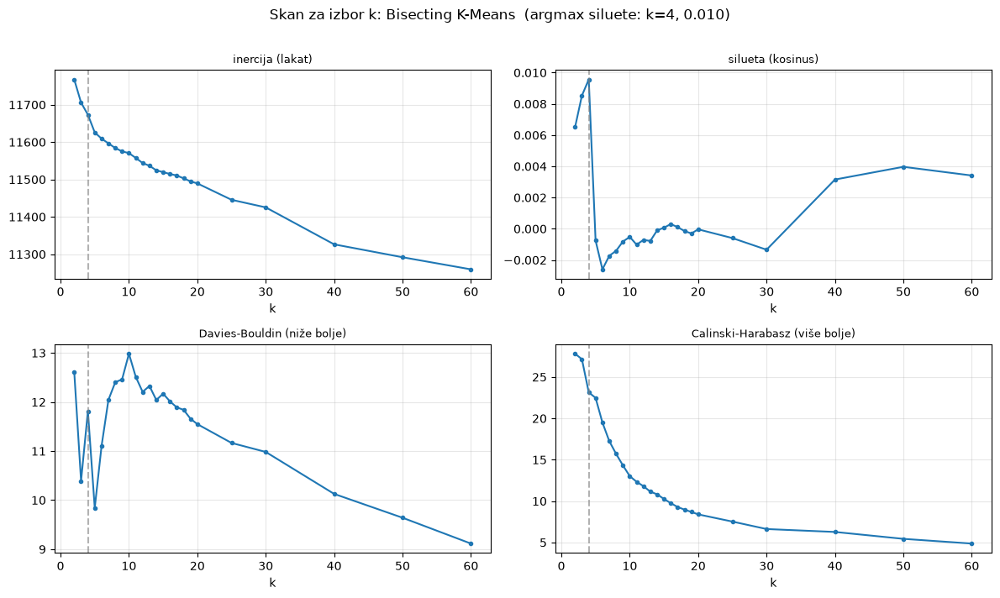

Bisecting K-Means: argmax siluete k=4 (0.009561297483742237)
[11:27:43] skan: Agglomerative (ward) ...
  [keš] param_choice_batt_agglomerative_ward.pkl učitan (obriši za ponovni račun)


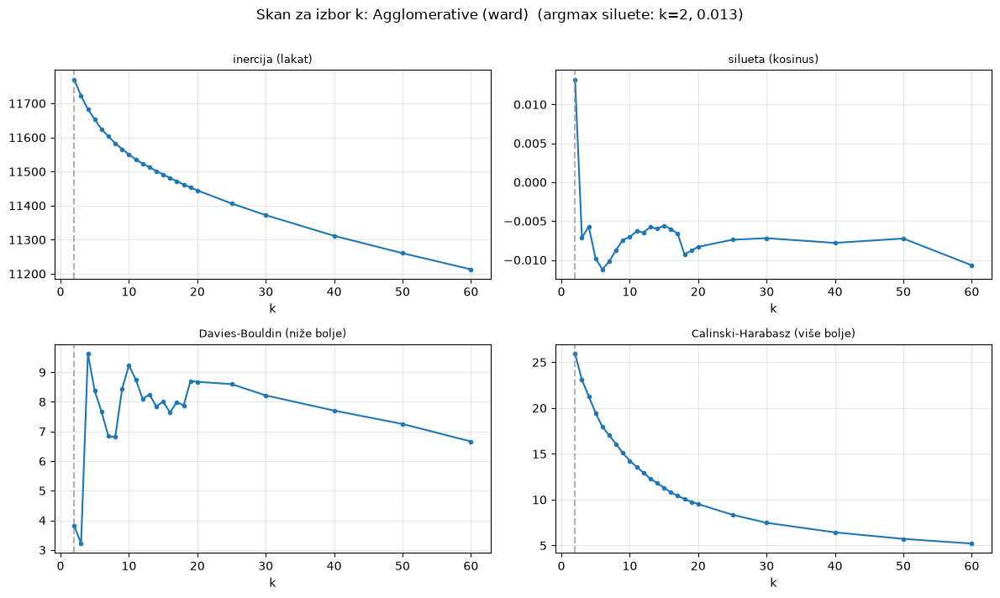

Agglomerative (ward): argmax siluete k=2 (0.013200841844081879)
[11:29:53] skan: GMM (diag) ...
  [keš] param_choice_batt_gmm_diag.pkl učitan (obriši za ponovni račun)


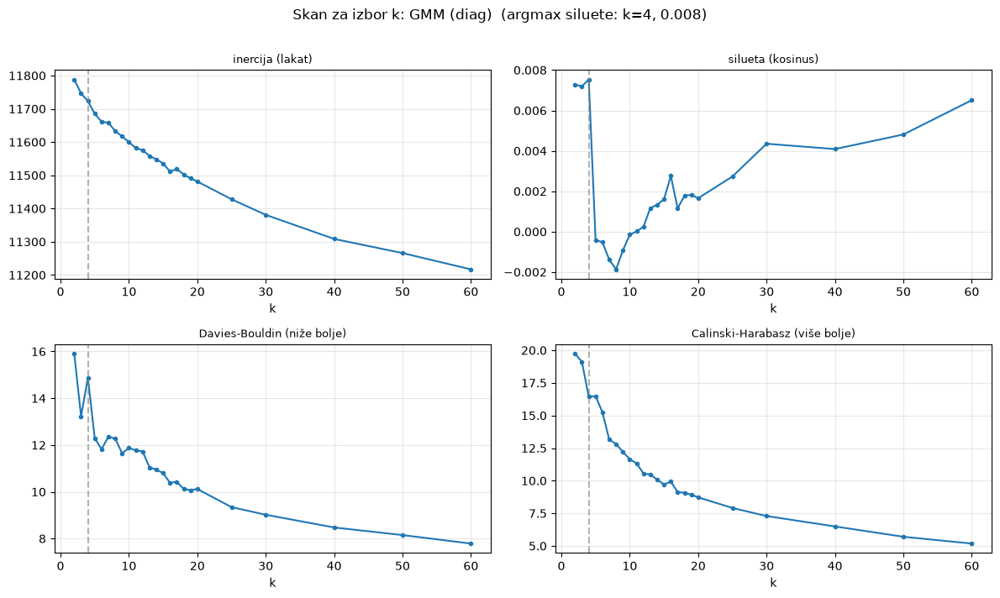

GMM (diag): argmax siluete k=4 (0.007533908821642399)
[11:32:11] skan: NMF ...
  [keš] param_choice_batt_nmf.pkl učitan (obriši za ponovni račun)


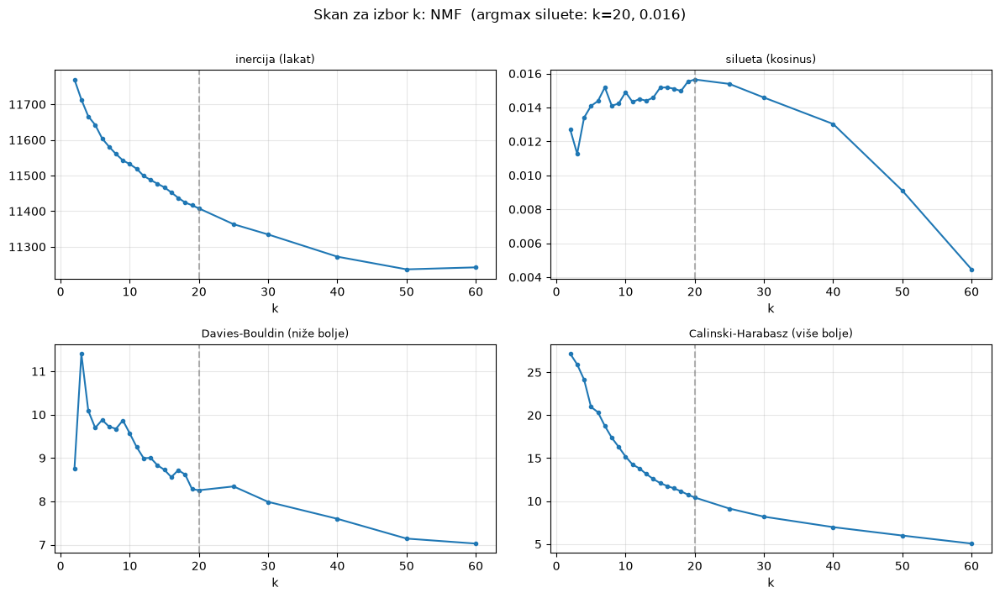

NMF: argmax siluete k=20 (0.01564808003604412)
[11:34:55] skan: Spectral (k-NN) ...
  [keš] param_choice_batt_spectral_k-nn.pkl učitan (obriši za ponovni račun)


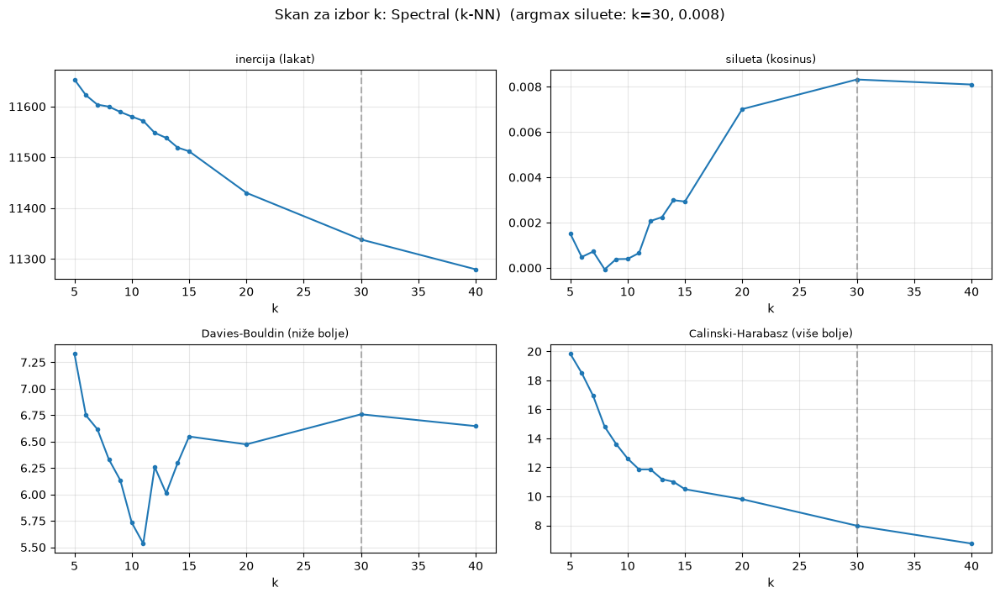

Spectral (k-NN): argmax siluete k=30 (0.008318480104207993)


In [4]:
GRID = list(range(2, 21)) + [25, 30, 40, 50, 60]
SPEC_GRID = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 20, 30, 40]


from sklearn import config_context


def skan(name, labels_by_k, X, fname=None):
    Xd = (np.asarray(X.todense(), dtype=np.float32)
          if issparse(X) else X)
    rows = []
    for k, lab in labels_by_k.items():
        with config_context(working_memory=128):
            m = internal_metrics(X, lab)
        rows.append(dict(k=k, sil=m["silhouette"], db=m["davies_bouldin"],
                         ch=m["calinski"],
                         inertia=round(inertia_of(lab, Xd), 1)))
    df = pd.DataFrame(rows)
    fname = fname or f"skan_{_safe_filename(name)}"
    df.to_csv(f"csv/{fname}.csv", index=False)
    fig, axes = plt.subplots(2, 2, figsize=(12, 7))
    best = df.loc[df.sil.idxmax()]
    for ax, col, t in zip(axes.ravel(),
                          ("inertia", "sil", "db", "ch"),
                          ("inercija (lakat)", "silueta (kosinus)",
                           "Davies-Bouldin (niže bolje)",
                           "Calinski-Harabasz (više bolje)")):
        ax.plot(df.k, df[col], marker="o", ms=3)
        ax.axvline(int(best.k), color="gray", ls="--", alpha=0.6)
        ax.set_title(t, fontsize=9); ax.set_xlabel("k")
        ax.grid(alpha=0.3)
    fig.suptitle(f"Skan za izbor k: {name}  "
                 f"(argmax siluete: k={int(best.k)}, {best.sil:.3f})",
                 y=1.01)
    fig.tight_layout()
    show_fig(f"{fname}.png")
    print(f"{name}: argmax siluete k={int(best.k)} ({best.sil})")
    return df


def fit_labels(name, X, Tfidf, X_dense=None):
    out = {}
    if name == "K-Means":
        for k in GRID:
            out[k] = KMeans(k, random_state=42, n_init=10) \
                .fit(X).labels_
    elif name == "Bisecting K-Means":
        for k in GRID:
            out[k] = BisectingKMeans(k, random_state=42).fit(X).labels_
    elif name == "Agglomerative (ward)":
        def _tree():
            return linkage(pdist(X_dense), method="ward")
        Z = cached("param_choice_ward_tree.pkl", _tree)
        for k in GRID:
            out[k] = fcluster(Z, t=k, criterion="maxclust")
    elif name == "GMM (diag)":
        for k in GRID:
            out[k] = GaussianMixture(
                k, covariance_type="diag", random_state=42
            ).fit(X_dense).predict(X_dense)
    elif name == "NMF":
        for k in GRID:
            out[k] = NMF(k, random_state=42, init="nndsvda",
                         max_iter=300).fit(Tfidf) \
                .transform(Tfidf).argmax(1)
    elif name == "Spectral (k-NN)":
        for k in SPEC_GRID:
            out[k] = SpectralClustering(
                k, affinity="nearest_neighbors", n_neighbors=30,
                random_state=42, n_jobs=-1).fit(X).labls_
    elif name == "BIRCH":
        for k in GRID:
            out[k] = Birch(n_clusters=k, threshold=0.3).fit(X).labels_
    return out


SKANS = {}
# BIRCH se ne računa u sirovom prolazu (memorija)
for name in ("Bisecting K-Means", "Agglomerative (ward)",
             "GMM (diag)", "NMF", "Spectral (k-NN)"):
    log(f"skan: {name} ...")
    labs = cached(f"param_choice_batt_{_safe_filename(name)}.pkl",
                  lambda n=name: fit_labels(n, red, tfidf,
                                            X_dense=red_dense))
    SKANS[name] = skan(name, labs, red)

## 3. Predstavnici na sopstvenom najboljem $k$


[11:36:52] najbolji k po skanovima: {'Bisecting K-Means': 4, 'Agglomerative (ward)': 2, 'GMM (diag)': 4, 'NMF': 20, 'Spectral (k-NN)': 30}
  [keš] param_choice_ward_tree.pkl učitan (obriši za ponovni račun)
  [keš] param_choice_bestk_labels.pkl izračunato i sačuvano
[11:45:36] K-Means: k=5, čistoća 0.4344, silueta -0.0002516063104849309
  [pkl] results\bestk_k-means.pkl


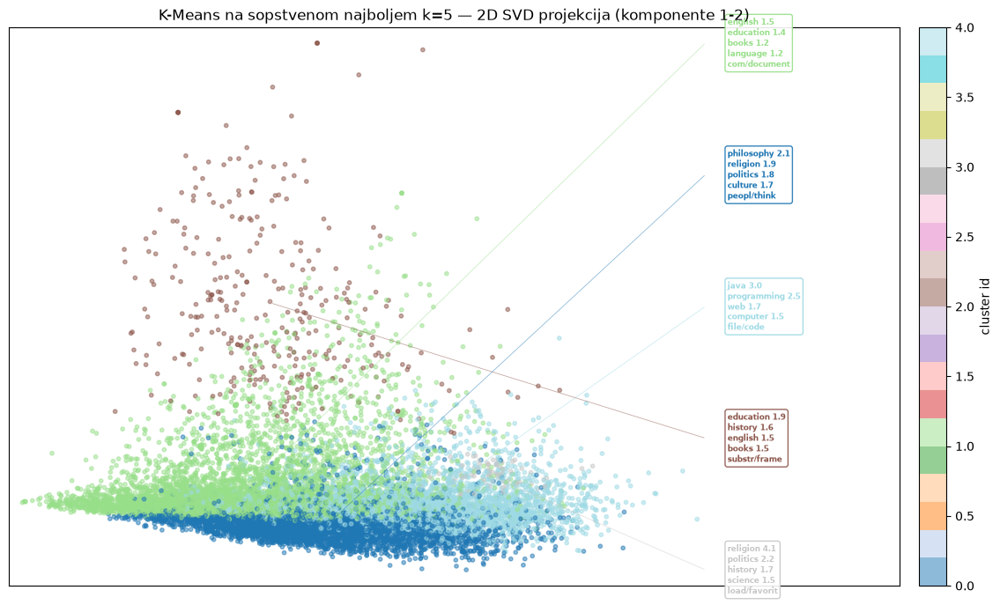

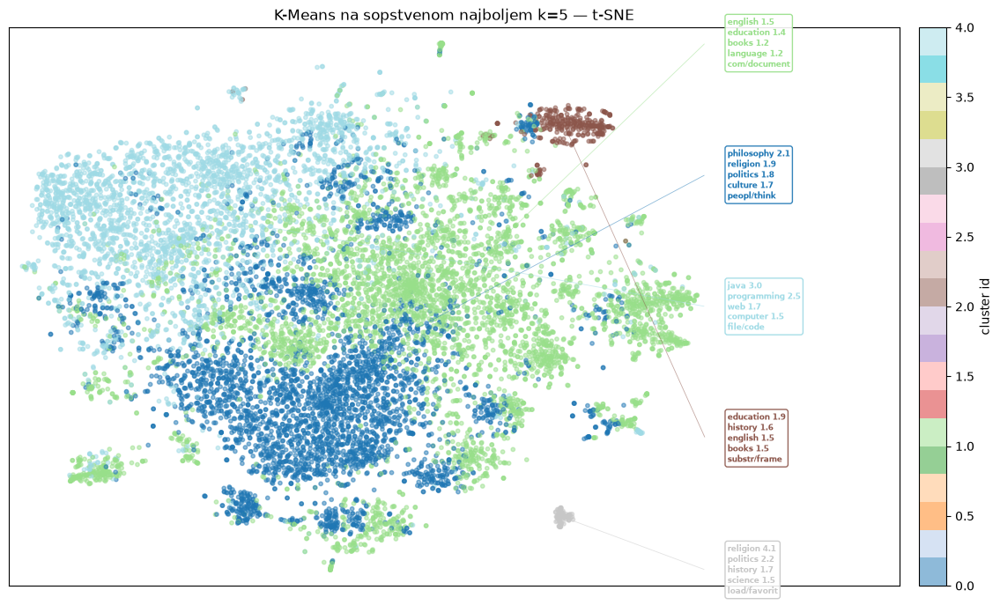

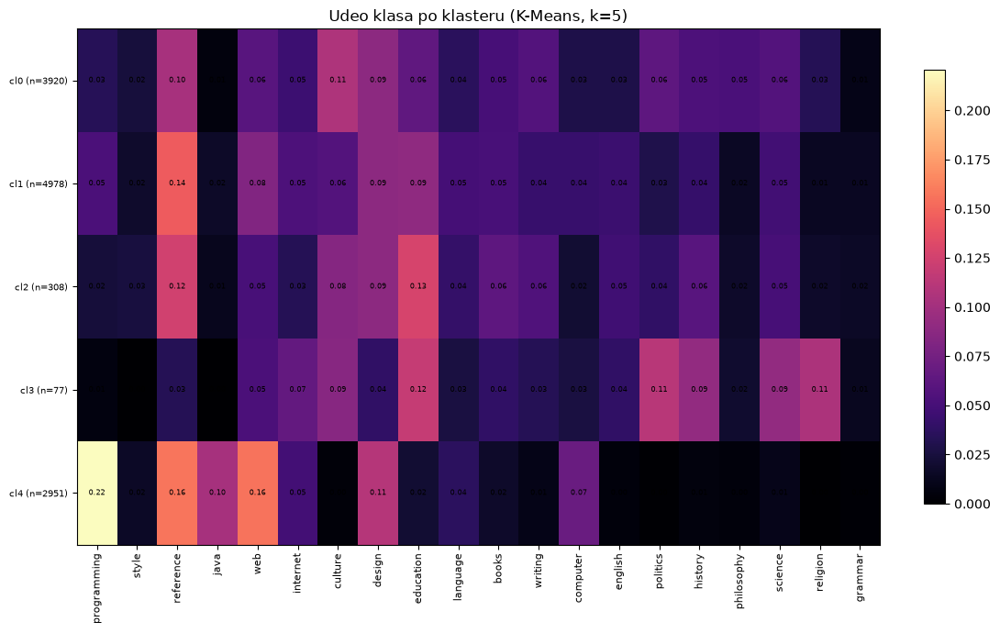


--- K-Means (k=5): klaster -> klase (lift) + reči ---
 cluster    n                                                     classes                                             words
       0 3920 philosophy x2.1, religion x1.9, politics x1.8, culture x1.7             peopl, think, thing, time, year, know
       1 4978     english x1.5, education x1.4, books x1.2, language x1.2   com, document, privaci, text, script, copyright
       2  308      education x1.9, history x1.6, english x1.5, books x1.5 substr, frame, parent, length, document, function
       3   77    religion x4.1, politics x2.2, history x1.7, science x1.5         load, favorit, pend, comment, spam, video
       4 2951        java x3.0, programming x2.5, web x1.7, computer x1.5            file, code, applic, java, instal, user
[11:45:51] Bisecting K-Means: k=4, čistoća 0.4329, silueta 0.009561297483742237
  [pkl] results\bestk_bisecting_k-means.pkl


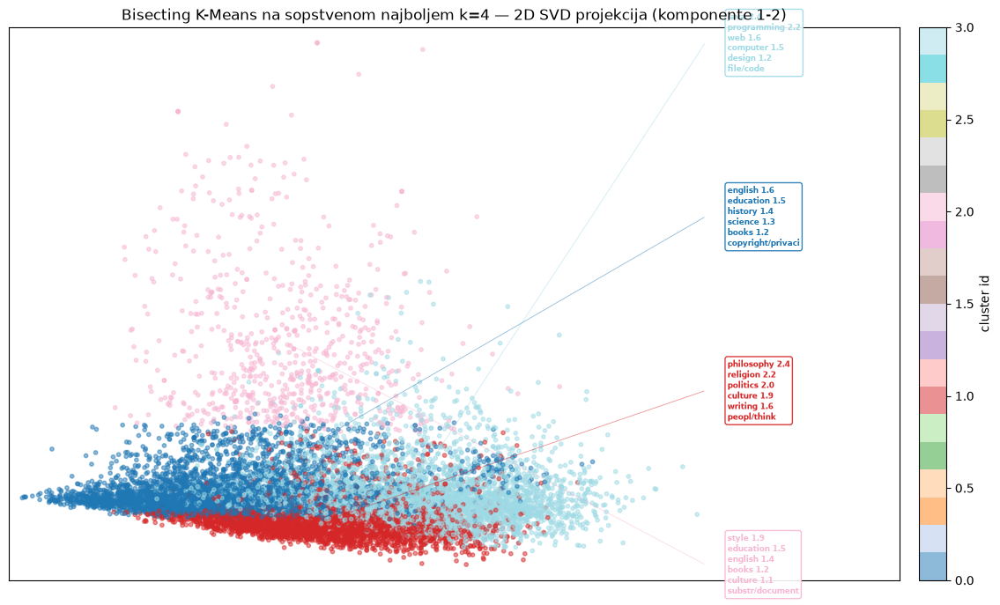

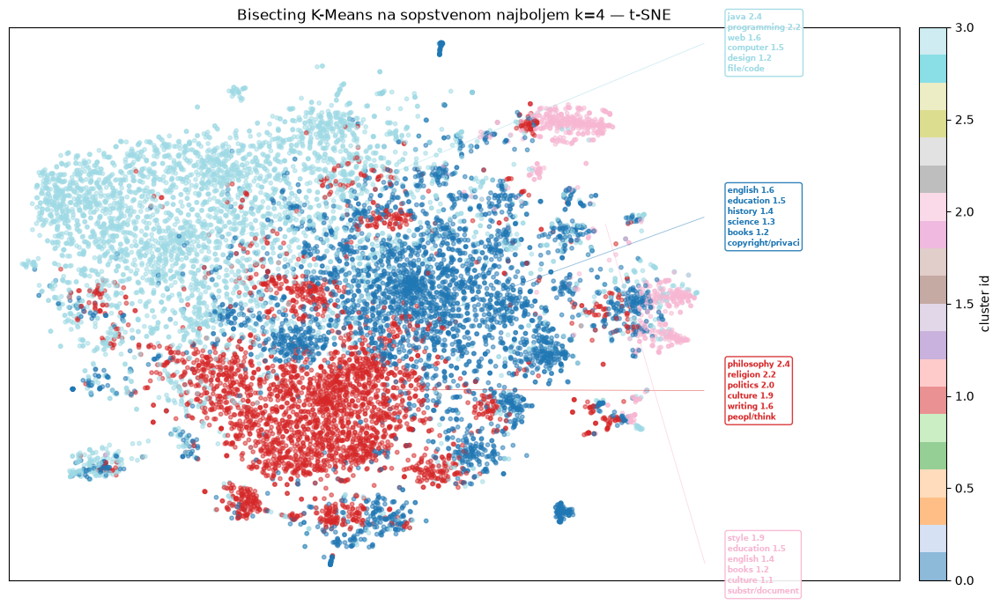

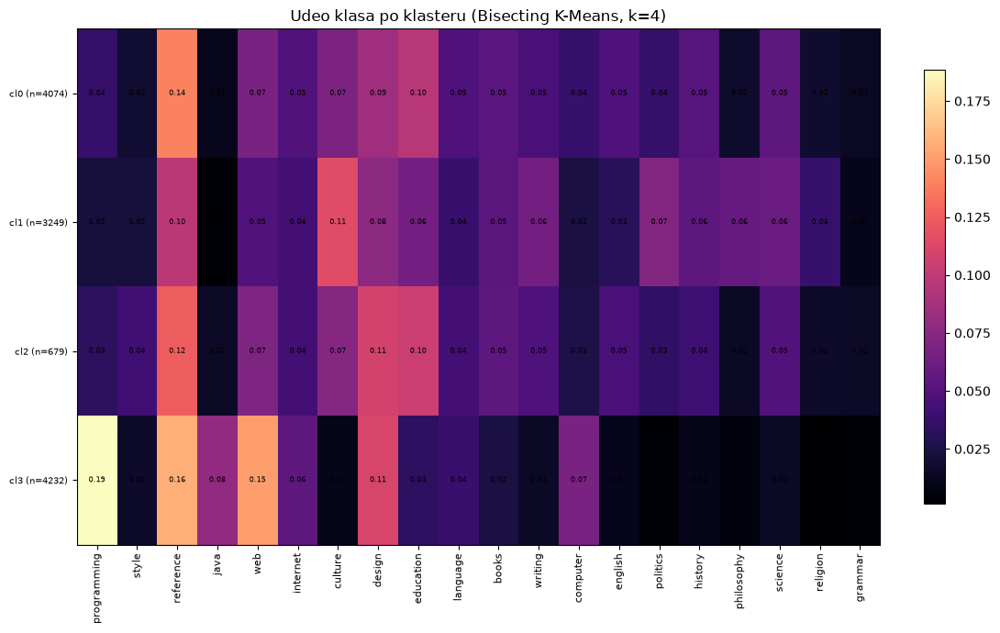


--- Bisecting K-Means (k=4): klaster -> klase (lift) + reči ---
 cluster    n                                                                   classes                                             words
       0 4074      english x1.6, education x1.5, history x1.4, science x1.3, books x1.2 copyright, privaci, contact, click, onlin, polici
       1 3249 philosophy x2.4, religion x2.2, politics x2.0, culture x1.9, writing x1.6             peopl, think, thing, year, time, know
       2  679        style x1.9, education x1.5, english x1.4, books x1.2, culture x1.1   substr, document, frame, parent, length, script
       3 4232         java x2.4, programming x2.2, web x1.6, computer x1.5, design x1.2          file, code, applic, java, user, download
[11:46:03] Agglomerative (ward): k=2, čistoća 0.3874, silueta 0.013200841844081879
  [pkl] results\bestk_agglomerative_ward.pkl


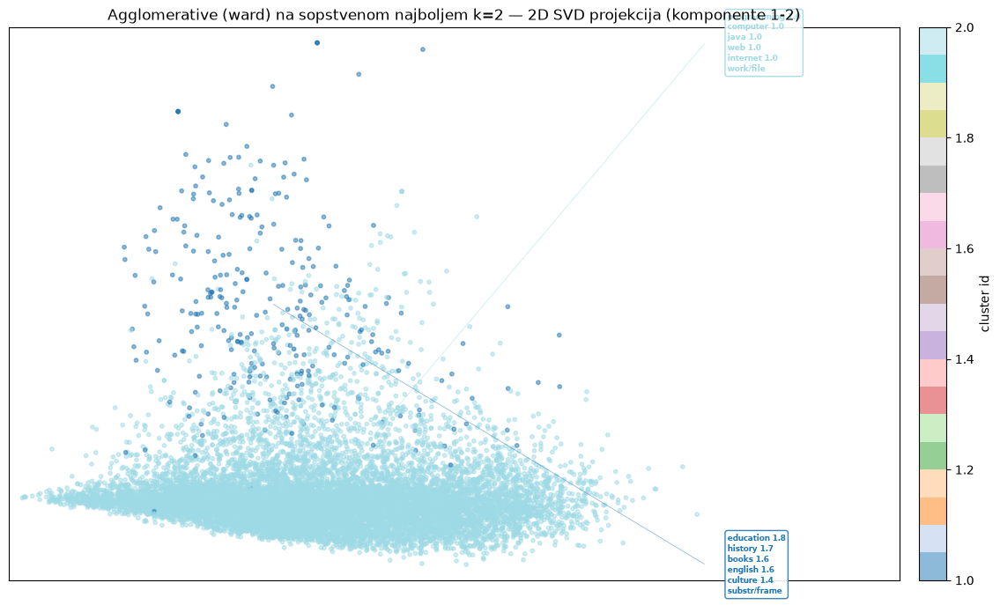

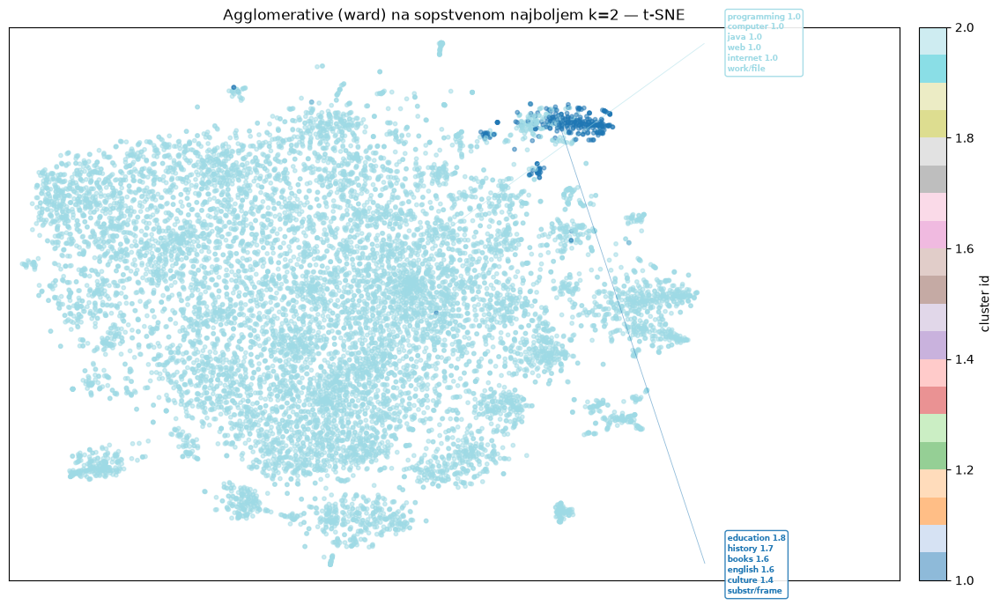

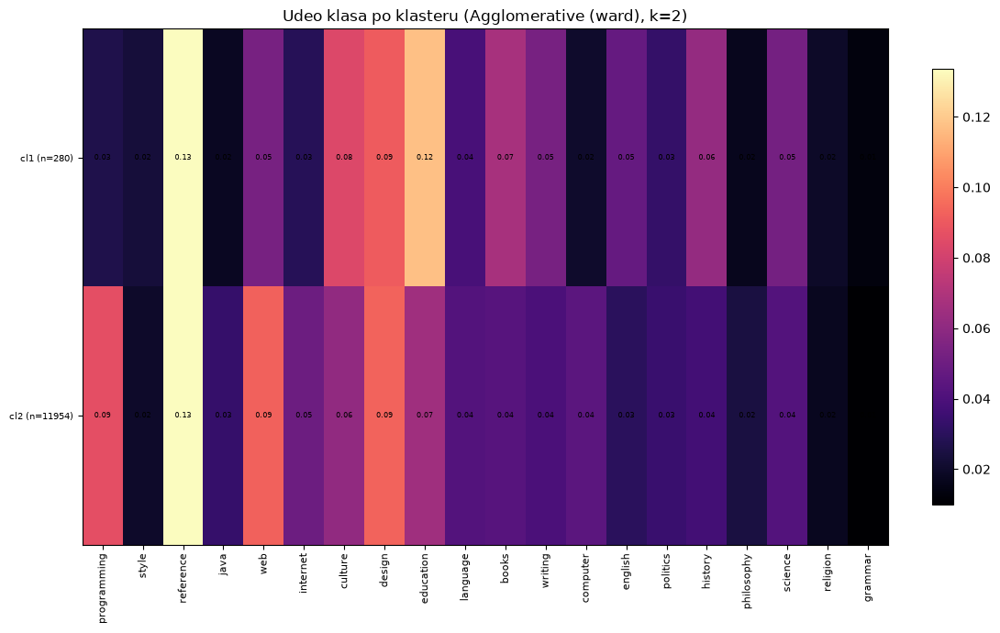


--- Agglomerative (ward) (k=2): klaster -> klase (lift) + reči ---
 cluster     n                                                              classes                                             words
       1   280 education x1.8, history x1.7, books x1.6, english x1.6, culture x1.4 substr, frame, parent, length, document, function
       2 11954  programming x1.0, computer x1.0, java x1.0, web x1.0, internet x1.0              work, file, need, user, import, post
[11:46:11] GMM (diag): k=4, čistoća 0.4258, silueta 0.007533908821642399
  [pkl] results\bestk_gmm_diag.pkl


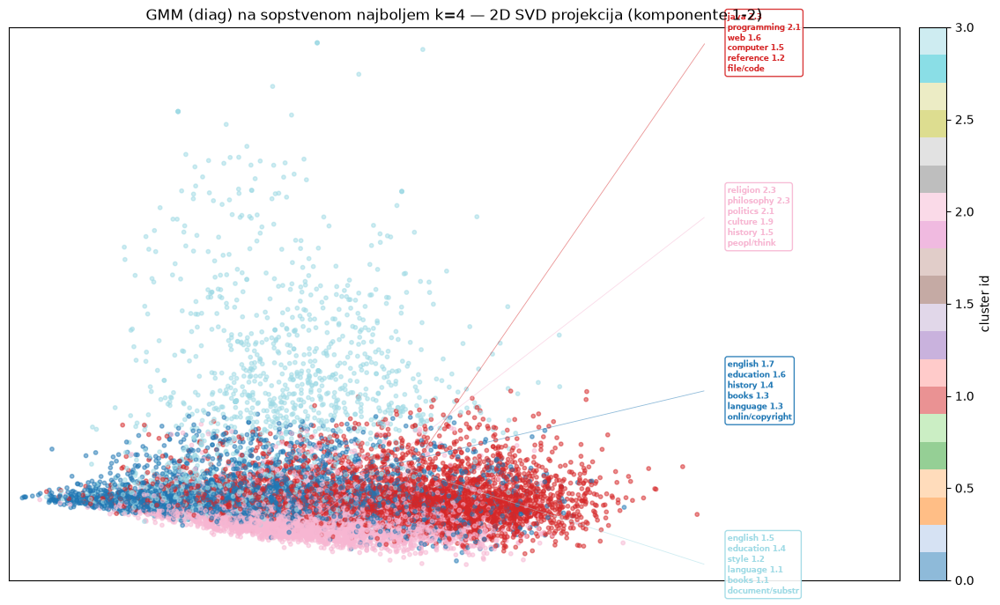

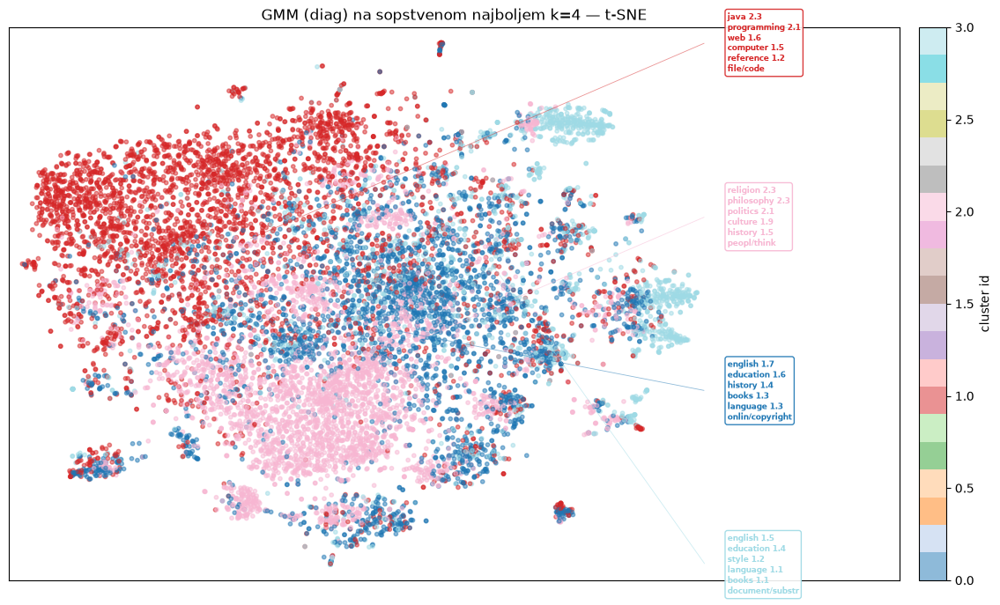

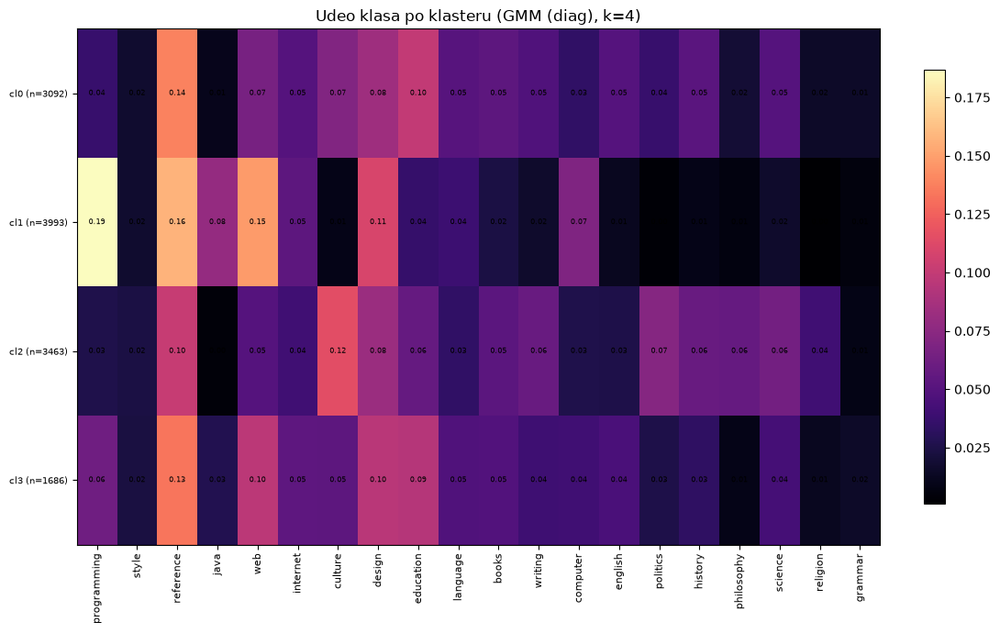


--- GMM (diag) (k=4): klaster -> klase (lift) + reči ---
 cluster    n                                                                   classes                                           words
       0 3092     english x1.7, education x1.6, history x1.4, books x1.3, language x1.3  onlin, copyright, site, free, english, univers
       1 3993      java x2.3, programming x2.1, web x1.6, computer x1.5, reference x1.2          file, code, applic, java, user, instal
       2 3463 religion x2.3, philosophy x2.3, politics x2.1, culture x1.9, history x1.5           peopl, think, thing, year, time, know
       3 1686       english x1.5, education x1.4, style x1.2, language x1.1, books x1.1 document, substr, frame, parent, script, length
[11:46:20] Spectral (k-NN): k=30, čistoća 0.5234, silueta 0.008220234885811806
  [pkl] results\bestk_spectral_k-nn.pkl


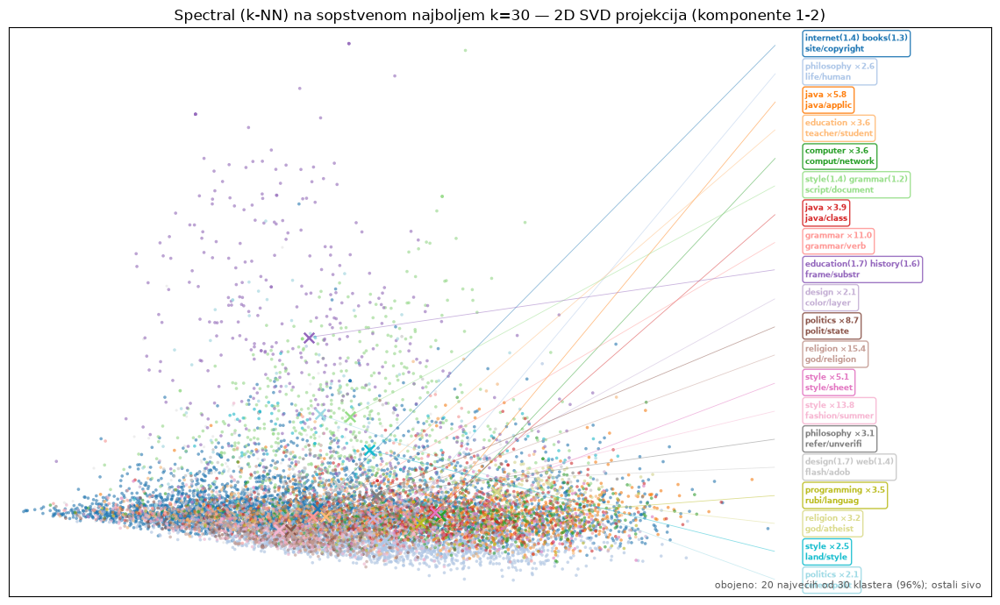

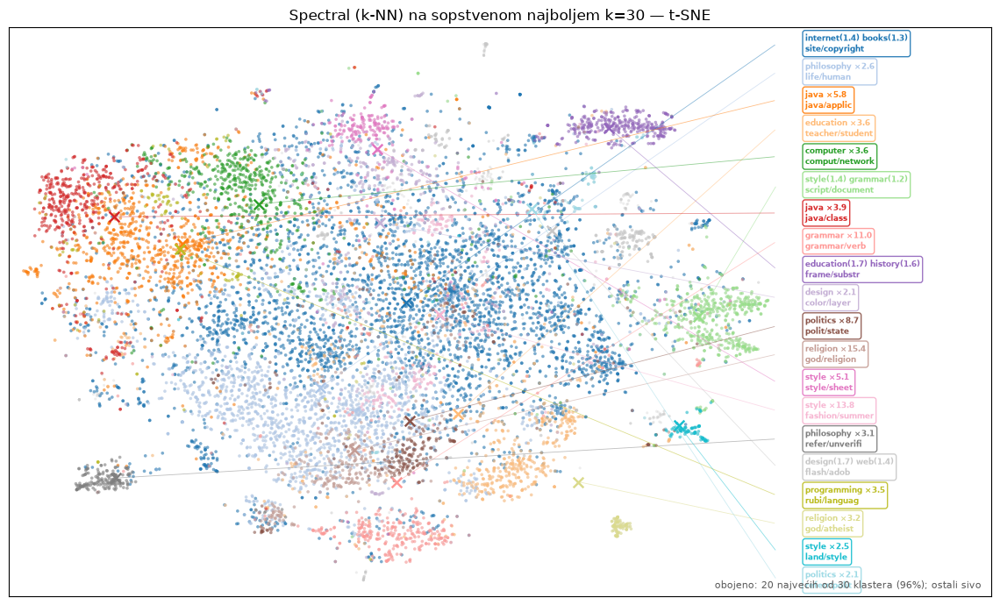

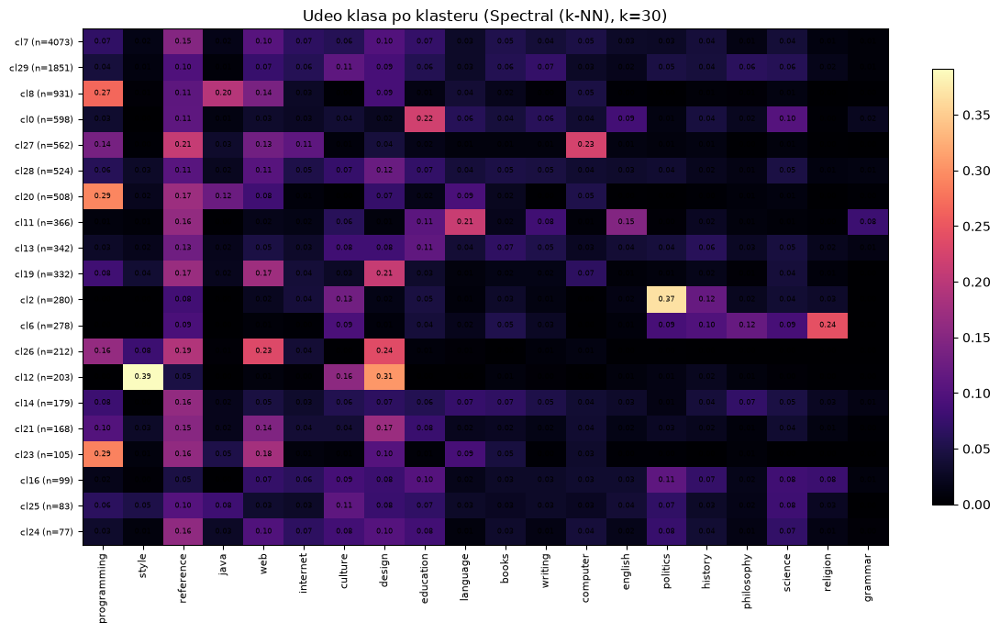

[11:46:35] NMF: k=20, čistoća 0.5010, silueta 0.01564808003604412
  [pkl] results\bestk_nmf.pkl


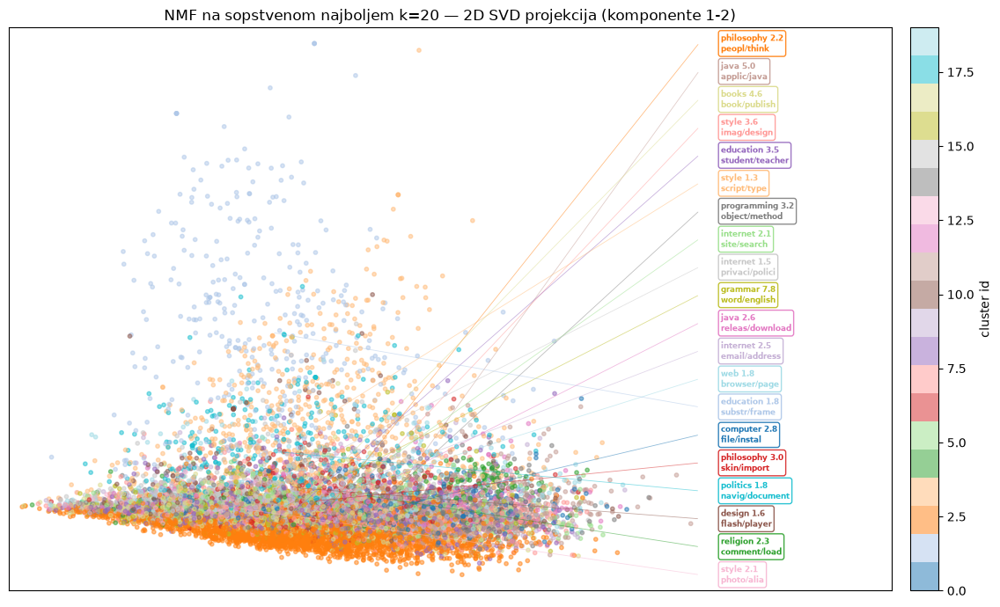

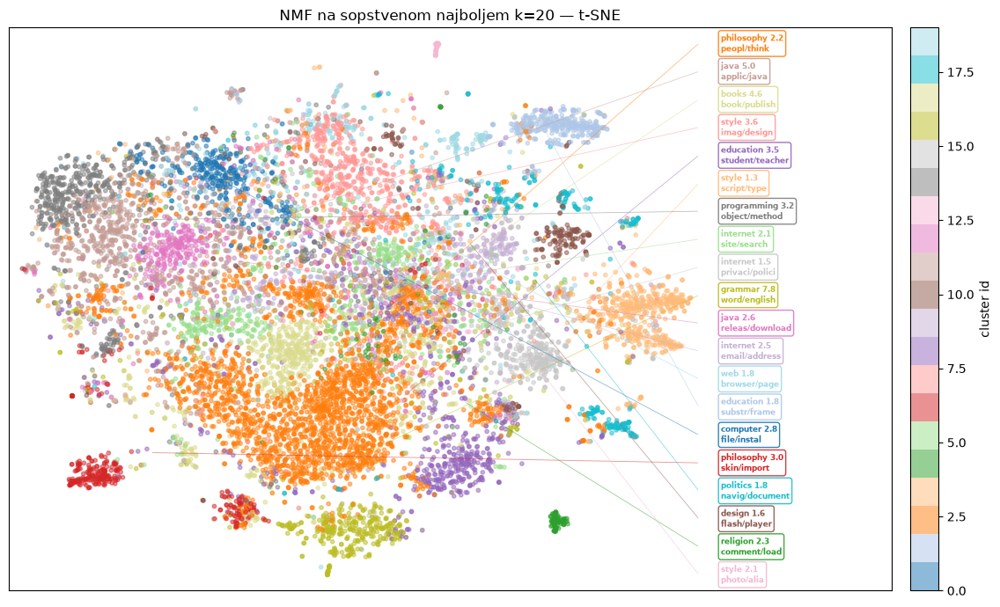

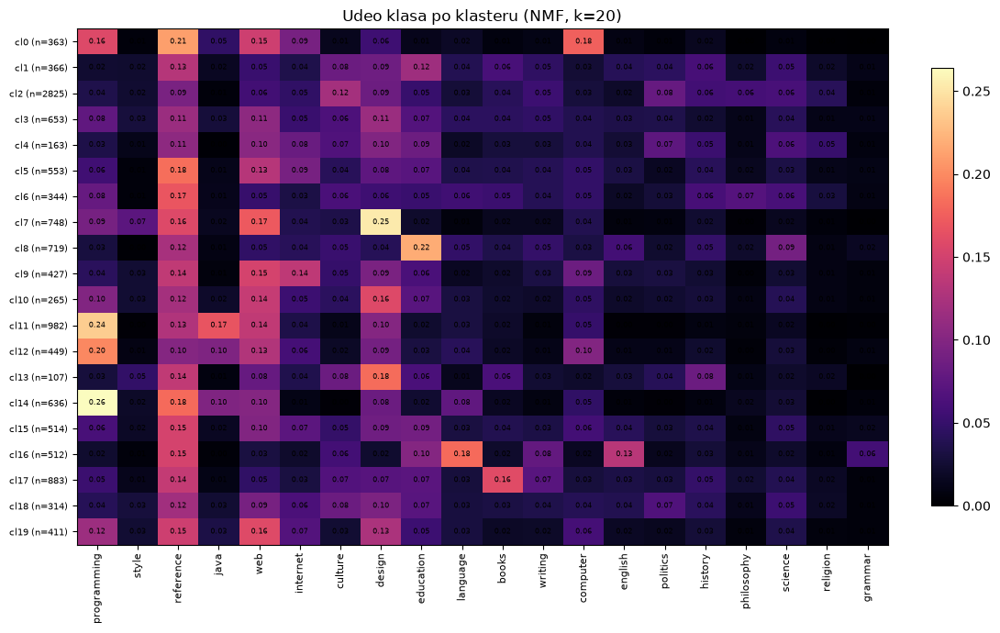

           algorithm  k_best  silhouette  purity
             K-Means       5   -0.000252  0.4344
   Bisecting K-Means       4    0.009561  0.4329
Agglomerative (ward)       2    0.013201  0.3874
          GMM (diag)       4    0.007534  0.4258
     Spectral (k-NN)      30    0.008220  0.5234
                 NMF      20    0.015648  0.5010


In [5]:
def _bestk_fits():
    out = {}
    k_km = int(pd.read_csv("csv/kscan_2_120.csv")
               .loc[lambda d: d.silhouette.idxmax(), "k"])
    k_km = 5  # vrh skana na 97 je plato sitnih klastera; struktura na k=5
    if k_km == K_FINE:
        out["K-Means"] = (k_km, joblib.load(
            "results/hierarchy_docs.pkl")["fine"])
    else:
        out["K-Means"] = (k_km, KMeans(k_km, random_state=42,
                                       n_init=10).fit(red).labels_)
    bk = {n: int(df.loc[df.sil.idxmax()].k)
          for n, df in SKANS.items()}
    if bk.get("Bisecting K-Means"):
        bk["Bisecting K-Means"] = 4 #po inerciji, DB i CH bi pre bilo 3, a sil razlika izmedju 3 i 4 nije velika
    log(f"najbolji k po skanovima: {bk}")
    if "Bisecting K-Means" in bk:
        k = bk["Bisecting K-Means"]
        out["Bisecting K-Means"] = (k, BisectingKMeans(
            k, random_state=42).fit(red).labels_)
    if "Agglomerative (ward)" in bk:
        k = bk["Agglomerative (ward)"]
        Z = cached("param_choice_ward_tree.pkl",
                   lambda: linkage(pdist(red_dense), method="ward"))
        out["Agglomerative (ward)"] = (
            k, fcluster(Z, t=k, criterion="maxclust"))
    if "GMM (diag)" in bk:
        k = bk["GMM (diag)"]  #slična situacija kao kod bissecting ali manje izražena, pa uzimamo 4
        out["GMM (diag)"] = (k, GaussianMixture(
            k, covariance_type="diag", random_state=42).fit(red_dense)
            .predict(red_dense))
    if "Spectral (k-NN)" in bk:
        k = bk["Spectral (k-NN)"]
        out["Spectral (k-NN)"] = (k, SpectralClustering(
            k, affinity="nearest_neighbors", n_neighbors=30,
            random_state=42, n_jobs=-1).fit(red).labels_)
    if "BIRCH" in bk:
        k = bk["BIRCH"]
        out["BIRCH"] = (k, Birch(n_clusters=k, threshold=0.3)
                         .fit(red).labels_)
    if "NMF" in bk:
        k = bk["NMF"]
        out["NMF"] = (k, NMF(k, random_state=42, init="nndsvda",
                             max_iter=300).fit(tfidf)
                      .transform(tfidf).argmax(1))
    return out

fits = cached("param_choice_bestk_labels.pkl", _bestk_fits)
var2 = (f"{F['svd'].explained_variance_ratio_[:2].sum():.0%} varijanse"
        if F.get("svd") is not None else "komponente 1-2")
summary = []
for name, (k, lab) in fits.items():
    m = internal_metrics(red, lab)
    pur = multilabel_purity(lab, Y)
    log(f"{name}: k={k}, čistoća {pur:.4f}, "
        f"silueta {m['silhouette']}")
    save_pkl(f"bestk_{_safe_filename(name)}.pkl",
             dict(algorithm=name, k=k, labels=lab,
                  purity=round(pur, 4),
                  silhouette=m["silhouette"]))
    st = bestk_stamps(lab, k, F)
    for emb, tag, ttl in (
            (emb2, "svd2d", f"2D SVD projekcija ({var2})"),
            (emb_tsne, "tsne", "t-SNE")):
        cluster_scatter(
            emb, np.asarray(lab), st,
            f"bestk_{_safe_filename(name)}_{tag}.png",
            f"{name} na sopstvenom najboljem k={k} — {ttl}",
            topn=20 if k > 20 else 12)
    k20_class_heatmap(F, lab, level=name, k_title=k,
                      fname=f"bestk_{_safe_filename(name)}"
                            f"_heatmap.png",
                      top_clusters=20 if k > 20 else None)
    if k < 20:
        bestk_words_table(lab, k, F, name)
    summary.append(dict(algorithm=name, k_best=k,
                        silhouette=m["silhouette"],
                        purity=round(pur, 4)))
pd.DataFrame(summary).to_csv("csv/bestk_table.csv", index=False)
print(pd.DataFrame(summary).to_string(index=False))

## 4. Isto za sloj rečenica (223 288)


uzorak: (20000, 8385) | puni sloj: (223288, 8385) | 2D SVD varijansa (samo za naslove slika): 0.8%
  [keš] param_choice_knn_labels.pkl učitan (obriši za ponovni račun)
[09:49:45] rečenice, skan: K-Means ...
  [keš] param_choice_sbatt_k-means.pkl učitan (obriši za ponovni račun)


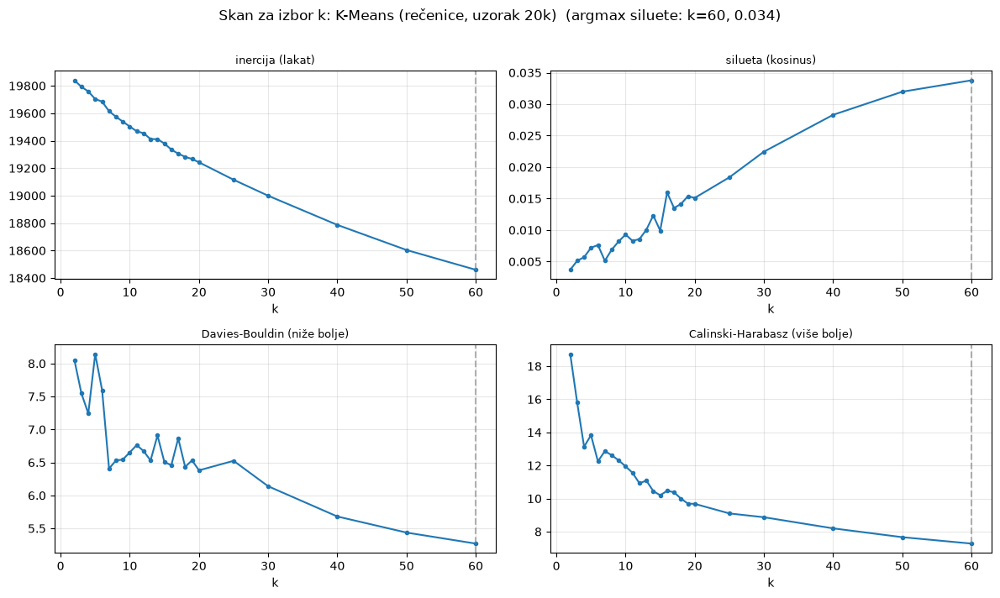

K-Means (rečenice, uzorak 20k): argmax siluete k=60 (0.03378453478217125)
[09:51:35] rečenice, skan: Bisecting K-Means ...
  [keš] param_choice_sbatt_bisecting_k-means.pkl učitan (obriši za ponovni račun)


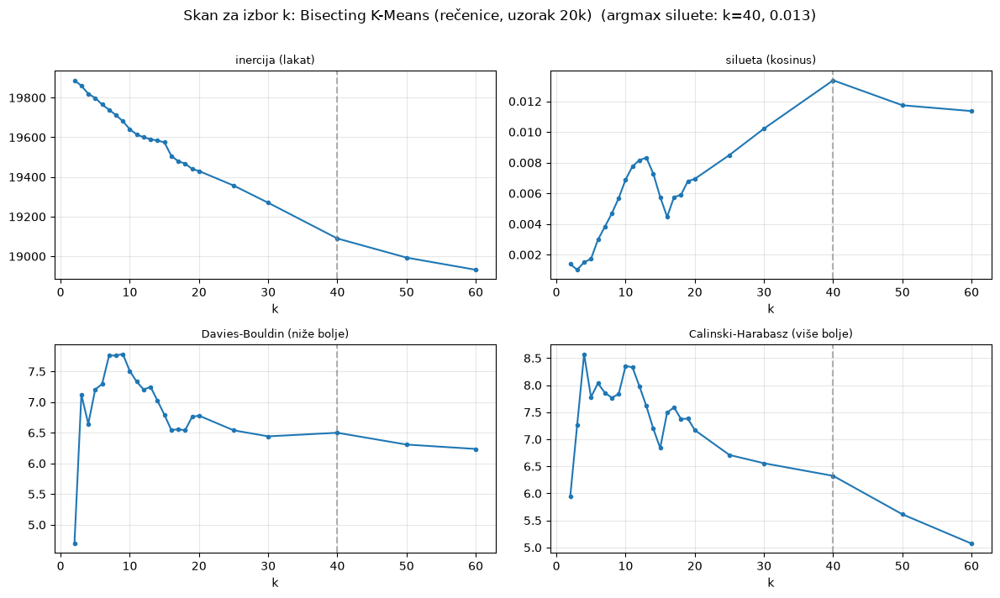

Bisecting K-Means (rečenice, uzorak 20k): argmax siluete k=40 (0.013366839848458767)
[09:53:40] rečenice, skan: GMM (diag) ...
  [keš] param_choice_sbatt_gmm_diag.pkl učitan (obriši za ponovni račun)


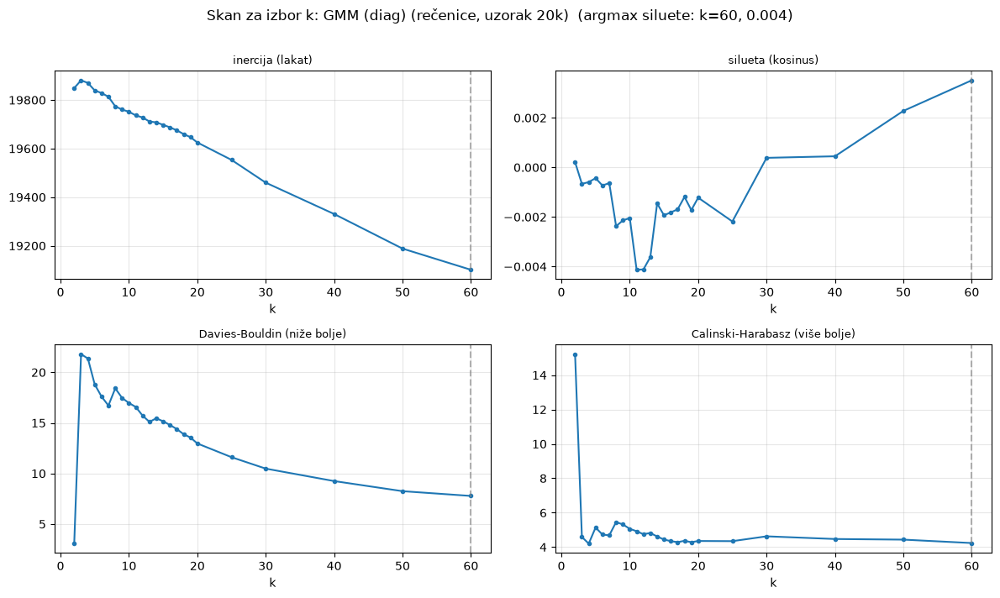

GMM (diag) (rečenice, uzorak 20k): argmax siluete k=60 (0.003514690324664116)
[09:55:54] rečenice, skan: NMF ...
  [keš] param_choice_sbatt_nmf.pkl učitan (obriši za ponovni račun)


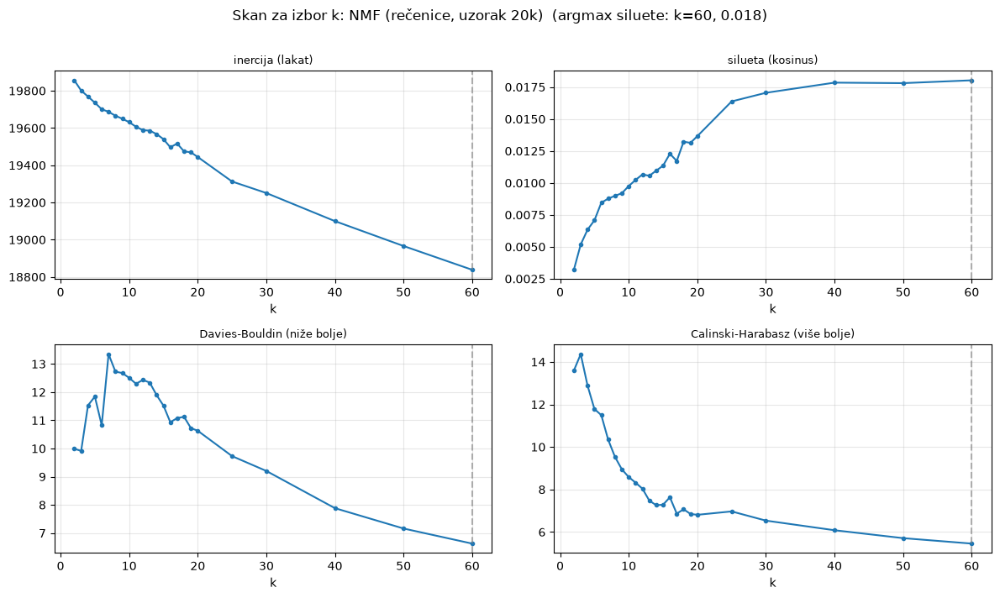

NMF (rečenice, uzorak 20k): argmax siluete k=60 (0.018025951460003853)


In [7]:
S = joblib.load("results/sent_features.pkl")
# sirovi prolaz: radni prostor rečenica je TF-IDF bez SVD-a
SENT_RED = S["tfidf"]
sub = S["sample_idx"]
Xs = S["sample"]["tfidf"]
Ys = S["Y"].astype(int)
Sd = dict(tfidf=S["sample"]["tfidf"], terms=S["sample"]["terms"],
          Y=Ys[sub], gmean=S["sample"]["gmean"])
Xs_dense = np.asarray(Xs.todense(), dtype=np.float32)
emb_tsne_s = joblib.load("results/tsne_sent_sample.pkl")
_svd2s = joblib.load("results/svd2_sent_sample.pkl")
emb2_s = _svd2s.transform(Xs)
SENT_EVR2 = float(_svd2s.explained_variance_ratio_.sum())
print("uzorak:", Xs.shape, "| puni sloj:", SENT_RED.shape,
      "| 2D SVD varijansa (samo za naslove slika):",
      f"{SENT_EVR2:.1%}")


G_IDX, G_Y = S["g_idx"], S["g_y"].astype(int)


def _knn_labels():
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=2).fit(SENT_RED[G_IDX])
    _, idx = nn.kneighbors(SENT_RED)
    nearest = idx[:, 0].copy()
    self_mask = nearest == np.arange(SENT_RED.shape[0])
    nearest[self_mask] = idx[self_mask, 1]
    return G_Y[nearest].astype(np.int8), nearest


Yknn, _ = cached("param_choice_knn_labels.pkl", _knn_labels)

SGRID = list(range(2, 21)) + [25, 30, 40, 50, 60]

SENT_SKANS = {}
for name in ("K-Means", "Bisecting K-Means", "GMM (diag)",
             "NMF"):
    log(f"rečenice, skan: {name} ...")
    labs = cached(f"param_choice_sbatt_{_safe_filename(name)}.pkl",
                  lambda n=name: fit_labels(n, Xs, Sd["tfidf"],
                                            X_dense=Xs_dense))
    SENT_SKANS[name] = skan(
        f"{name} (rečenice, uzorak 20k)", labs, Xs,
        fname=f"sent_skan_{_safe_filename(name)}")

  [keš] param_choice_sbest_k.pkl učitan (obriši za ponovni račun)
najbolji k po silueti (rečenice): {'K-Means': 60, 'Bisecting K-Means': 40, 'GMM (diag)': 60, 'NMF': 60}
  [keš] param_choice_sbestk_labels.pkl učitan (obriši za ponovni račun)
[10:01:29] rečenice K-Means: k=60, čist.(nasl.) 0.3992, čist.(1468) 0.2943, sil 0.03487179055809975
  [pkl] results\sent_bestk_k-means.pkl


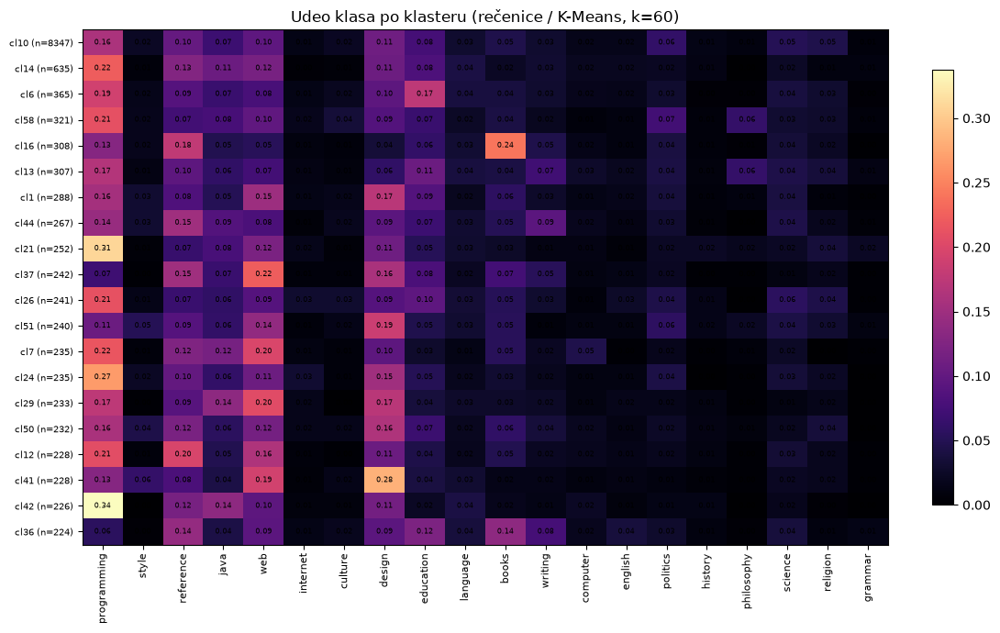

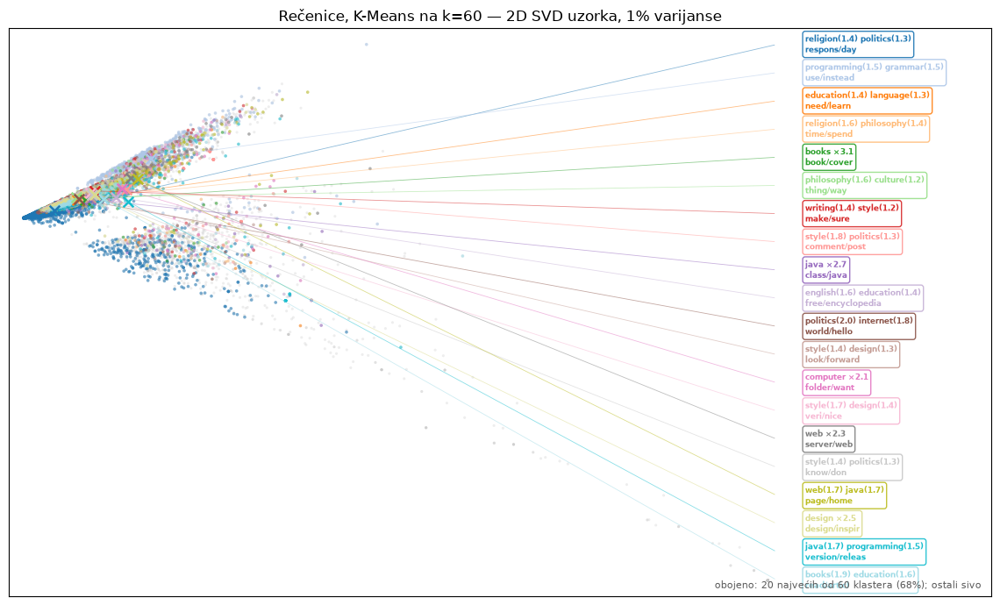

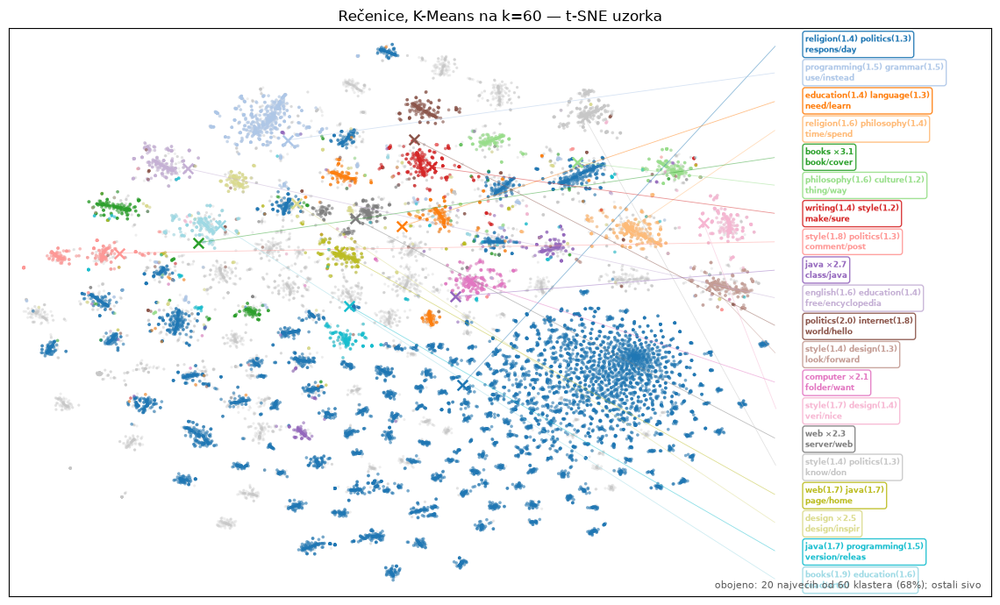

[10:01:41] rečenice Bisecting K-Means: k=40, čist.(nasl.) 0.3877, čist.(1468) 0.2609, sil 0.009296664968132973
  [pkl] results\sent_bestk_bisecting_k-means.pkl


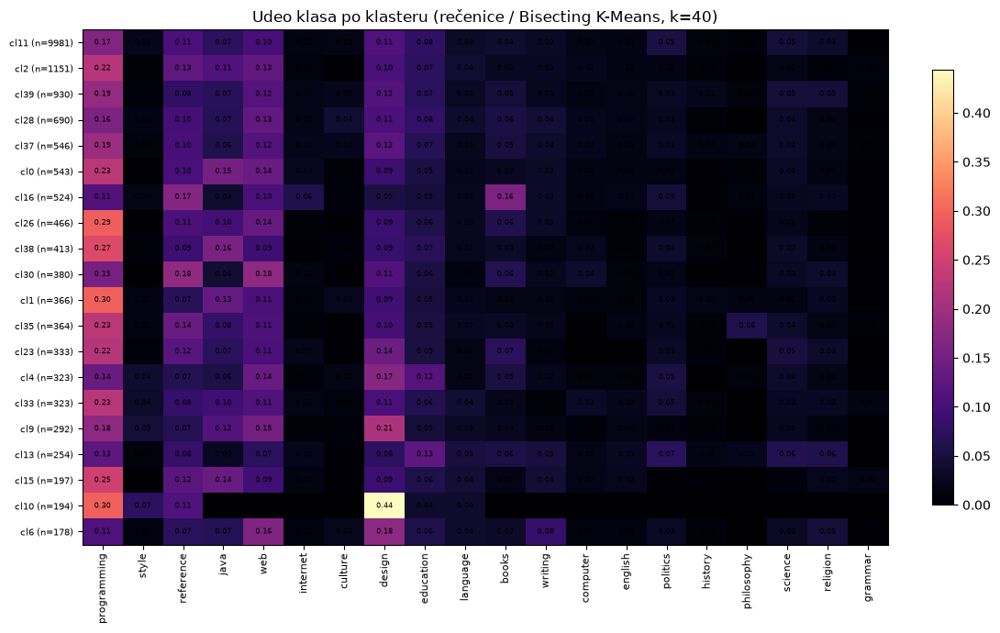

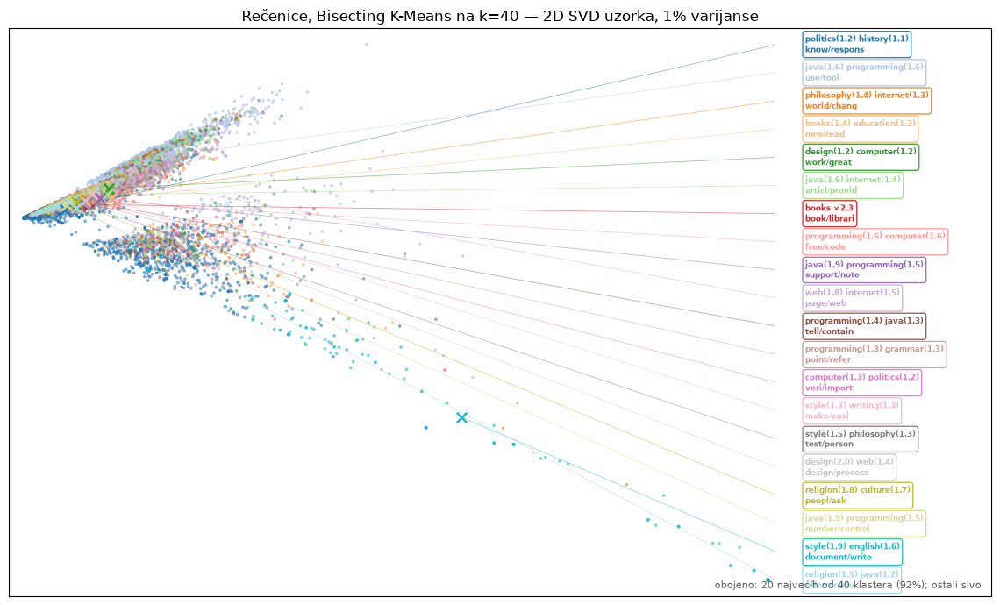

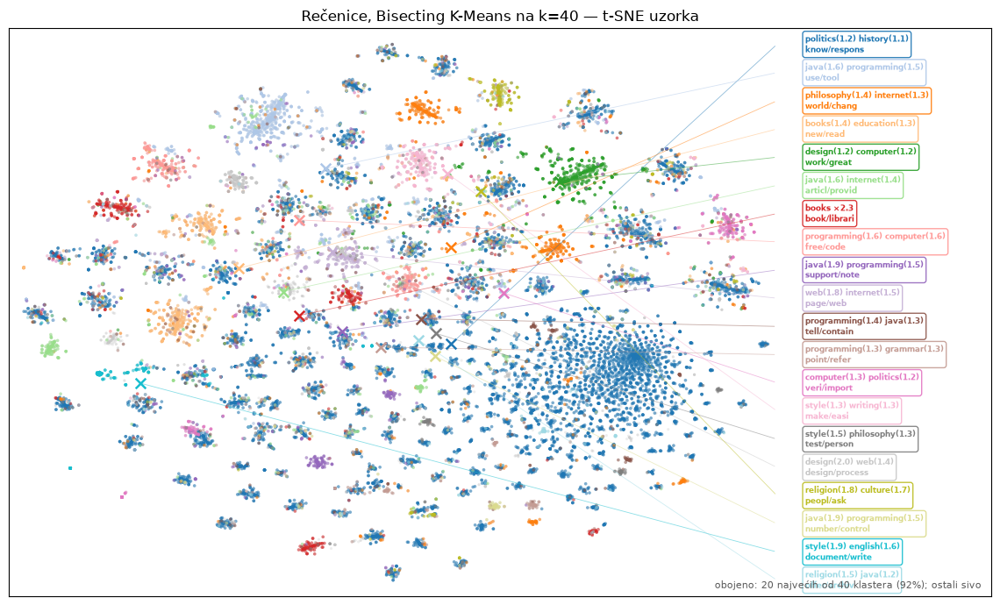

[10:01:53] rečenice GMM (diag): k=60, čist.(nasl.) 0.3873, čist.(1468) 0.2418, sil 0.003739523235708475
  [pkl] results\sent_bestk_gmm_diag.pkl


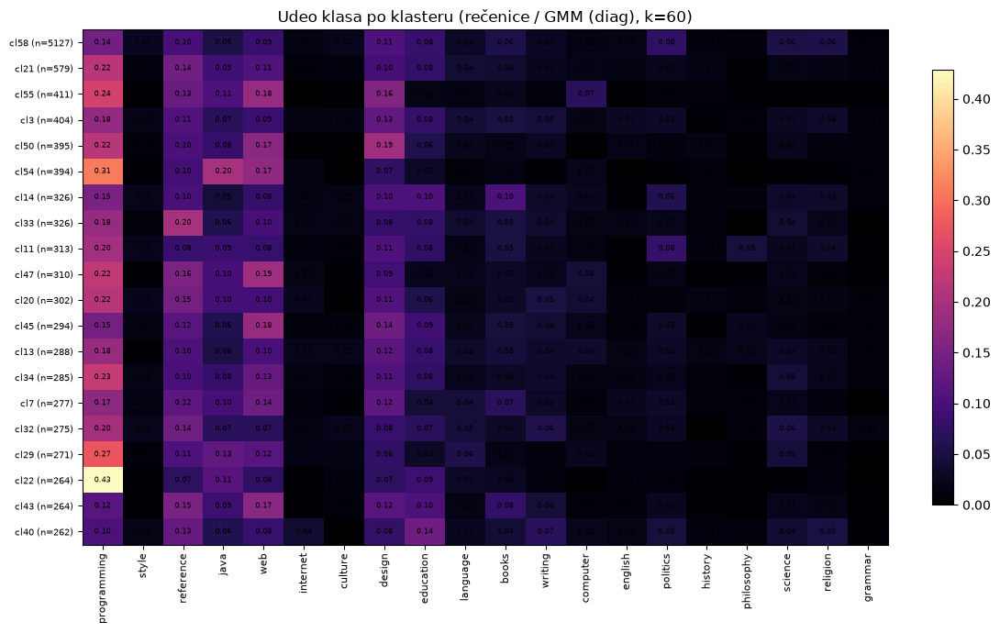

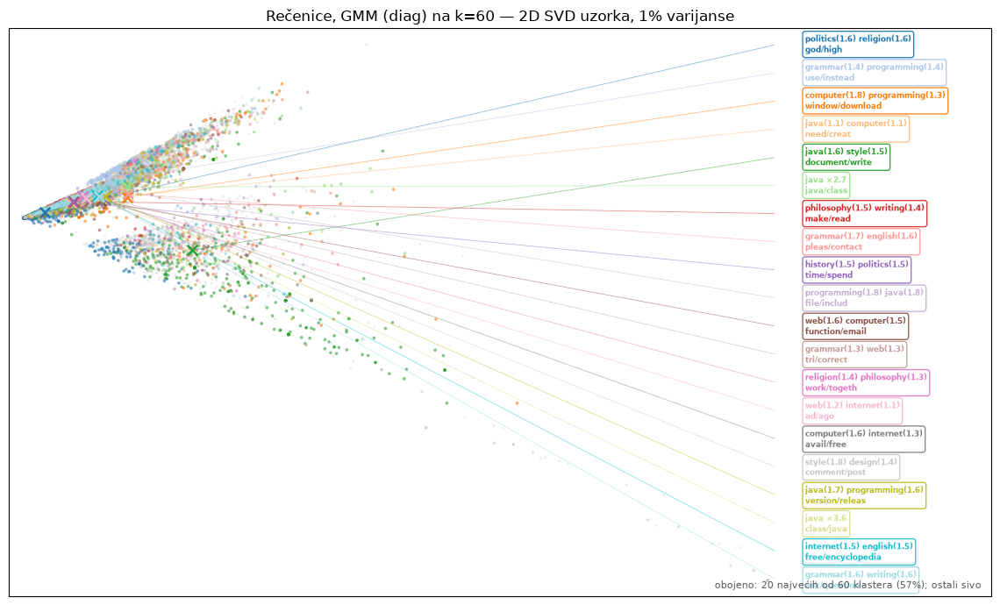

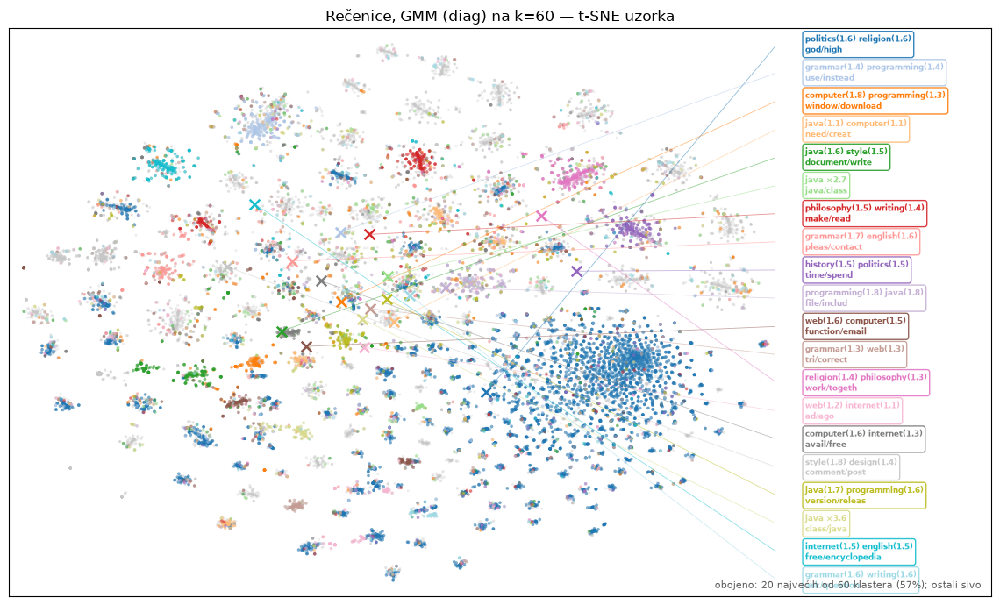

[10:02:06] rečenice NMF: k=60, čist.(nasl.) 0.3977, čist.(1468) 0.3488, sil 0.01926877722144127
  [pkl] results\sent_bestk_nmf.pkl


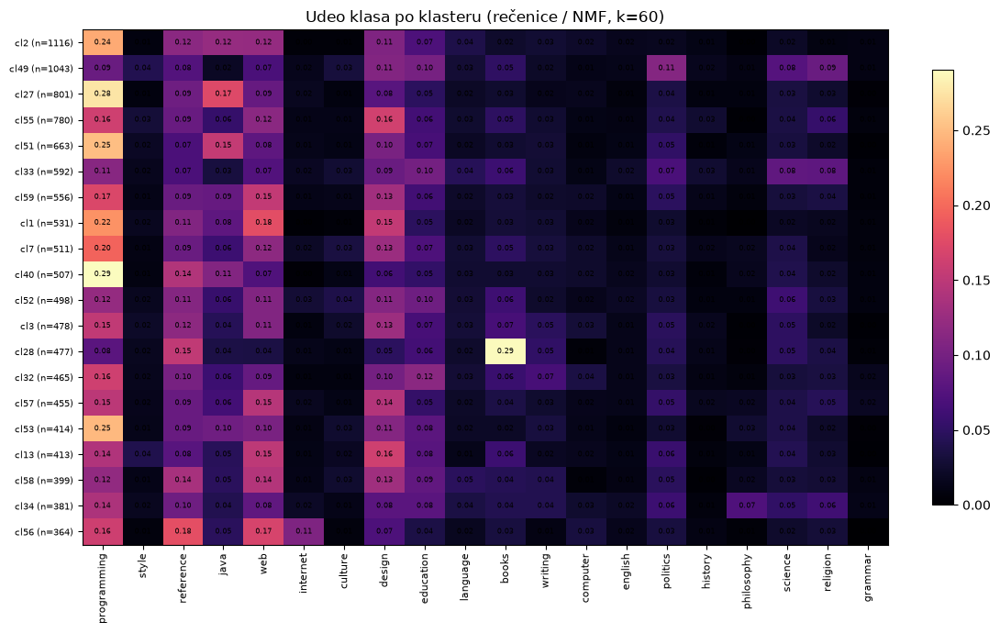

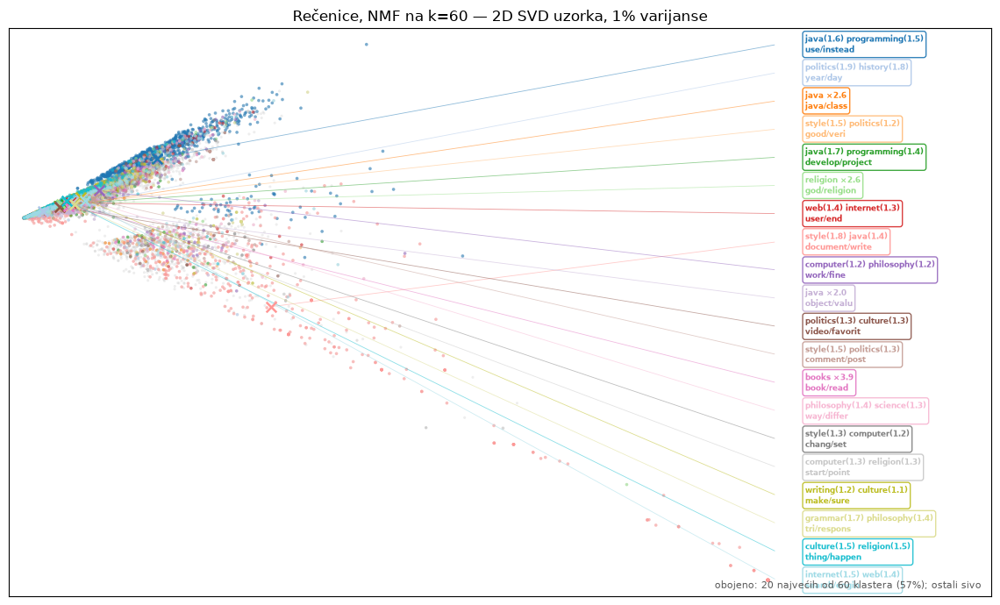

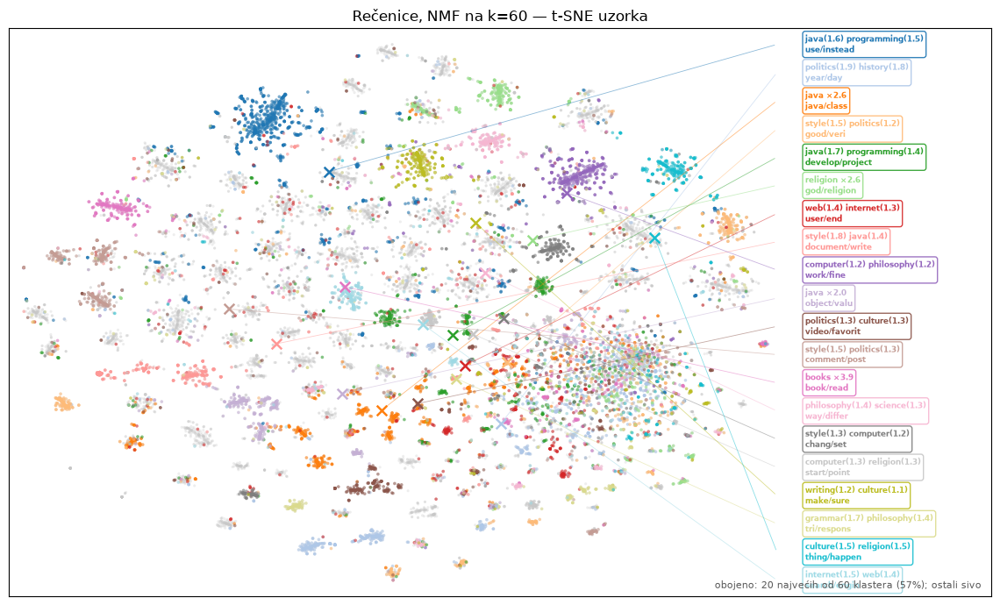

        algorithm  k_best  silhouette  purity_inherited  purity_true1468
          K-Means      60    0.034872            0.3992           0.2943
Bisecting K-Means      40    0.009297            0.3877           0.2609
       GMM (diag)      60    0.003740            0.3873           0.2418
              NMF      60    0.019269            0.3977           0.3488


In [9]:
def _sbest_k():
    return {name: int(df.loc[df.sil.idxmax()].k)
            for name, df in SENT_SKANS.items()}

SBEST = cached("param_choice_sbest_k.pkl", _sbest_k)
print("najbolji k po silueti (rečenice):", SBEST)

def _sbestk_fits():
    out = {}
    for name, k in SBEST.items():
        if name == "K-Means":
            lab = KMeans(k, random_state=42, n_init=10) \
                .fit(SENT_RED).labels_
        elif name == "Bisecting K-Means":
            lab = BisectingKMeans(k, random_state=42) \
                .fit(SENT_RED).labels_
        elif name == "GMM (diag)":
            gmm = GaussianMixture(
                k, covariance_type="diag", random_state=42
            ).fit(Xs_dense)
            lab = np.empty(SENT_RED.shape[0], dtype=np.int64)
            step = 10000
            for i in range(0, SENT_RED.shape[0], step):
                lab[i:i + step] = gmm.predict(np.asarray(
                    SENT_RED[i:i + step].todense(),
                    dtype=np.float32))
        elif name == "BIRCH":
            th, lab = fit_birch_guarded(SENT_RED, k)
            log(f"  [birch] čuva prag {th}")
        elif name == "NMF":
            lab = NMF(k, random_state=42, init="nndsvda",
                      max_iter=300).fit(S["tfidf"]) \
                .transform(S["tfidf"]).argmax(1)
        out[name] = (k, lab)
        log(f"  rečenice {name}: fit k={k}")
    return out

sfits = cached("param_choice_sbestk_labels.pkl", _sbestk_fits)
rows = []
g_idx, g_y = S["g_idx"], S["g_y"].astype(int)
for name, (k, lab) in sfits.items():
    m = internal_metrics(SENT_RED, lab)
    pur = multilabel_purity(lab, S["Y"].astype(int))
    pur_true = multilabel_purity(lab[g_idx], g_y)
    log(f"rečenice {name}: k={k}, čist.(nasl.) {pur:.4f}, "
        f"čist.(1468) {pur_true:.4f}, sil {m['silhouette']}")
    save_pkl(f"sent_bestk_{_safe_filename(name)}.pkl",
             dict(algorithm=name, k=k, labels=lab,
                  purity_inherited=round(pur, 4),
                  purity_true1468=round(pur_true, 4),
                  silhouette=m["silhouette"]))
    st = bestk_stamps(lab[sub], k, Sd)
    k20_class_heatmap(dict(Y=Yknn[sub]), np.asarray(lab[sub]),
                      level=f"re\u010denice / {name}", k_title=k,
                      fname=f"sent_bestk_{_safe_filename(name)}"
                            f"_heatmap.png",
                      top_clusters=20 if k > 20 else None)
    svar2 = (f", {SENT_EVR2:.0%} varijanse"
             if SENT_EVR2 is not None else "")
    for emb, tag, ttl in (
            (emb2_s, "svd2d", f"2D SVD uzorka{svar2}"),
            (emb_tsne_s, "tsne", "t-SNE uzorka")):
        cluster_scatter(
            emb, np.asarray(lab[sub]), st,
            f"sent_bestk_{_safe_filename(name)}_{tag}.png",
            f"Rečenice, {name} na k={k} — {ttl}",
            topn=20 if k > 20 else 12)
    rows.append(dict(algorithm=name, k_best=k,
                     silhouette=m["silhouette"],
                     purity_inherited=round(pur, 4),
                     purity_true1468=round(pur_true, 4)))
pd.DataFrame(rows).to_csv("csv/sent_bestk_table.csv", index=False)
print(pd.DataFrame(rows).to_string(index=False))

## 5. Oznake rečenica: nasleđe dokumenta naspram k-NN prenosa


In [10]:
import os, re
from sklearn.neighbors import NearestNeighbors

def _knn_labels():
    nn = NearestNeighbors(n_neighbors=2).fit(SENT_RED[g_idx])
    _, idx = nn.kneighbors(SENT_RED)
    nearest = idx[:, 0].copy()
    self_mask = nearest == np.arange(SENT_RED.shape[0])
    nearest[self_mask] = idx[self_mask, 1]
    Yk = g_y[nearest].astype(np.int8)
    return Yk, nearest

Yknn, nn_idx = cached("param_choice_knn_labels.pkl", _knn_labels)
print("kNN oznake:", Yknn.shape,
      "| prose\u010dan broj oznaka:", round(float(Yknn.sum(1).mean()), 2),
      "| bez ijedne:", int((Yknn.sum(1) == 0).sum()))

def _proxy_quality(pred, true):
    inter = (pred & true).sum(1)
    union = (pred | true).sum(1)
    return dict(
        hit=float((inter > 0).mean()),
        jaccard=float((inter / np.maximum(union, 1)).mean()))

Y_true = g_y.astype(bool)
Y_inh_sonda = S["Y"][g_idx].astype(bool)
Y_loo = Yknn[g_idx].astype(bool)
cal = pd.DataFrame([
    dict(izvor="nasle\u0111e dokumenta", **_proxy_quality(Y_inh_sonda, Y_true)),
    dict(izvor="k-NN (LOO, 1-NN)", **_proxy_quality(Y_loo, Y_true))])
cal.to_csv("csv/sent_label_calibration.csv", index=False)
print(cal.round(3).to_string(index=False))

Ys_full = S["Y"].astype(int)
rows = []
_layers = [(f"sent_algorithms_k{int(m.group(1))}.pkl",
            f"k={int(m.group(1))}")
           for f in sorted(os.listdir("results"))
           if (m := re.match(r"sent_algorithms_k(\d+)\.pkl", f))]
_layers.append(("param_choice_sbestk_labels.pkl", "najbolji k"))
for pkl, layer in _layers:
    d = joblib.load(os.path.join("results", pkl))
    if "labels_of" in d:
        labs = d["labels_of"].items()
    else:
        labs = ((n, v[1]) for n, v in d.items())
    for name, lab in labs:
        lab = np.asarray(lab)
        rows.append(dict(
            layer=layer, algorithm=name,
            pur_nasl=round(multilabel_purity(lab, Ys_full), 4),
            pur_knn=round(multilabel_purity(lab, Yknn), 4),
            pur_true=round(multilabel_purity(lab[g_idx], g_y), 4)))
kn = pd.DataFrame(rows)
kn.to_csv("csv/sent_purity_three_sources.csv", index=False)
print(kn.to_string(index=False))

# poređenje SVD dimenzija je deo glavne (SVD) sveske — ovde je
# reprezentacija fiksna (sirovi TF-IDF), pa se dim-skan preskače

  [keš] param_choice_knn_labels.pkl učitan (obriši za ponovni račun)
kNN oznake: (223288, 20) | prosečan broj oznaka: 1.14 | bez ijedne: 74375
            izvor   hit  jaccard
nasleđe dokumenta 0.736    0.472
 k-NN (LOO, 1-NN) 0.736    0.736
     layer         algorithm  pur_nasl  pur_knn  pur_true
      k=20           K-Means    0.3896   0.2083    0.2500
      k=20 Bisecting K-Means    0.3847   0.2045    0.2214
      k=20               GMM    0.3874   0.2032    0.2296
      k=20               NMF    0.3897   0.2104    0.2486
      k=39           K-Means    0.3996   0.2160    0.2759
      k=39 Bisecting K-Means    0.3877   0.2104    0.2602
      k=39               GMM    0.3878   0.2038    0.2364
      k=39               NMF    0.3892   0.2160    0.2977
najbolji k           K-Means    0.3992   0.2178    0.2943
najbolji k Bisecting K-Means    0.3877   0.2105    0.2609
najbolji k        GMM (diag)    0.3873   0.2042    0.2418
najbolji k               NMF    0.3977   0.2218    0.3488


## 6. Revizija ne-k parametara

Svi ključni parametri osim k na k=20: init×n_init K-Means-a, strategija Bisectinga, kovarijansa GMM-a (BIC) + n_init, init NMF-a, min_samples DBSCAN-a (eps istim pravilom pokrivenosti), n_neighbors Spektralnog i branching_factor BIRCH-a; Wardova linkage familija dolazi iz `csv/linkage_check.csv`.

In [6]:
def parameter_audit(Fd):
    red, tfidf_, Y = Fd["red"], Fd["tfidf"], Fd["Y"]
    rows = []

    def rec(algorithm, param, value, labels, note=""):
        m = internal_metrics(red, labels)
        rows.append(dict(
            algorithm=algorithm, param=param, value=str(value),
            purity=round(multilabel_purity(labels, Y), 4),
            sil=round(m["silhouette"], 4),
            db=round(m["davies_bouldin"], 2),
            ch=round(m["calinski"], 1),
            n_clusters=m["n_clusters"],
            coverage=round(m["coverage"], 2), note=note))
        return rows[-1]

    def _scan():
        # --- K-Means: init × n_init ---
        for init in ("k-means++", "random"):
            for n_init in (4, 10, 20):
                km = KMeans(K_MAIN, random_state=42, init=init,
                            n_init=n_init).fit(red)
                rec("K-Means", "init×n_init", f"{init}/{n_init}",
                    km.labels_,
                    "default" if (init == "k-means++"
                                  and n_init == 10) else "")
        # --- Bisecting K-Means: strategija ---
        for strategy in ("biggest_inertia", "largest_cluster"):
            bkm = BisectingKMeans(K_MAIN, random_state=42,
                                  bisecting_strategy=strategy) \
                .fit(red)
            rec("Bisecting K-Means", "strategy", strategy,
                bkm.labels_, "default"
                if strategy == "biggest_inertia" else "")
        # --- GMM: kovarijansa (BIC) + n_init ---
        for cov in ("spherical", "diag"):  # pune neizvodljive na ~8.5k dim
            g = GaussianMixture(K_MAIN, covariance_type=cov,
                                random_state=42).fit(red_dense)
            rec("GMM", "covariance(BIC)",
                f"{cov} BIC={g.bic(red_dense):.0f}", g.predict(red_dense),
                "selected by BIC" if cov == "diag" else "")
        for n_init in (1, 10):
            g = GaussianMixture(K_MAIN, covariance_type="diag",
                                random_state=42,
                                n_init=n_init).fit(red_dense)
            rec("GMM (diag)", "n_init", n_init, g.predict(red_dense),
                "default" if n_init == 1 else "")
        # --- NMF: init (frobenius) ---
        for init in ("nndsvda", "nndsvd", "random"):
            nm = NMF(K_MAIN, random_state=42, init=init,
                     max_iter=500).fit(tfidf_)
            rec("NMF", "init", init,
                nm.transform(tfidf_).argmax(1),
                "current choice" if init == "nndsvda" else "")
        # --- DBSCAN: min_samples (eps istim pravilom) ---
        for ms in (5, 10, 20, 30):
            best_eps, best_n = None, -1
            for eps in (0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.1):
                lab = DBSCAN(eps=eps, min_samples=ms).fit_predict(red)
                n_c = len(set(lab.tolist()) - {-1})
                cov = float((lab != -1).mean())
                if cov >= 0.5 and n_c > best_n:
                    best_eps, best_n = eps, n_c
            if best_eps is None:
                best_eps = 1.1  # nijedan eps ne dostiže pokrivenost 0.5
            lab = DBSCAN(eps=best_eps, min_samples=ms) \
                .fit_predict(red)
            rec("DBSCAN", "min_samples(eps rule)",
                f"ms={ms}, eps={best_eps}", lab,
                "current choice" if ms == 10 else "")
        # --- Spectral: n_neighbors ---
        for nn in (10, 20, 30, 50):
            spec = SpectralClustering(
                K_MAIN, affinity="nearest_neighbors", n_neighbors=nn,
                random_state=42, n_jobs=-1).fit(red)
            rec("Spectral (k-NN)", "n_neighbors", nn, spec.labels_,
                "current choice" if nn == 30 else "")
        # --- BIRCH: ne računa se u sirovom prolazu (memorija) ---
        return rows

    rows = cached("param_audit_scan.pkl", _scan)

    # Ward: linkage familija
    if os.path.exists("csv/linkage_check.csv"):
        lc = pd.read_csv("csv/linkage_check.csv")
        for _, r in lc.iterrows():
            rows.append(dict(
                algorithm="Agglomerative",
                param="linkage(cut quality)",
                value=r["linkage"], purity=round(r["purity_k20"], 4),
                sil=round(r["sil_k20"], 4), db=np.nan, ch=np.nan,
                n_clusters=K_MAIN, coverage=1.0,
                note=("current choice" if r["linkage"] == "ward"
                      else f"cophenetic {r['cophenetic']:.2f}")))

    df = pd.DataFrame(rows)
    df.to_csv("csv/param_scan_documents.csv", index=False)
    print("\n--- Revizija ne-k parametara (k=20, dokumenti): "
          "čistoća + silueta + napomena izbora ---")
    with pd.option_context("display.width", 200):
        print(df.to_string(index=False))
    return df

param_audit_df = parameter_audit(F)

  [keš] param_audit_scan.pkl izračunato i sačuvano

--- Revizija ne-k parametara (k=20, dokumenti): čistoća + silueta + napomena izbora ---
        algorithm                 param                    value  purity     sil    db   ch  n_clusters  coverage            note
          K-Means           init×n_init              k-means++/4  0.4787  0.0088  8.22 11.9          20      1.00                
          K-Means           init×n_init             k-means++/10  0.5069  0.0091  8.29 12.1          20      1.00         default
          K-Means           init×n_init             k-means++/20  0.5069  0.0091  8.29 12.1          20      1.00                
          K-Means           init×n_init                 random/4  0.5009  0.0093  7.91 12.0          20      1.00                
          K-Means           init×n_init                random/10  0.5009  0.0093  7.91 12.0          20      1.00                
          K-Means           init×n_init                random/20  0.5009  0.0093